In [1]:
!hostname

pe2cc3-042.c.nygenome.org


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import scanpy as sc
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score
from matplotlib.font_manager import FontProperties
import anndata as ad

from scipy.stats import ranksums
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import matplotlib.cm as cm

from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
import scipy.sparse
from scipy.sparse import csr_matrix
from scipy.sparse import coo_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.stats import entropy
import umap

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

import statsmodels.api as sm
from statsmodels.stats.multitest import fdrcorrection

import sys
# Add the directory containing IsovizPy.py to the Python path
sys.path.append('/gpfs/commons/home/kisaev/Leaflet-private/src/visualization')

# Import the module
import IsovizPy as ja

# Increase the font scale for seaborn
sns.set(font_scale=1.5)  # Adjust this value to increase or decrease font size
sns.set_style("white")  # Set the background to white

### Load all datasets!

In [ ]:
# Splicing anndata object 
splice_adata = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/ATSE_Anndata_Object_with_initializations_20241017_162621.h5ad" 
splice_adata = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/NOGTF/ATSE_Anndata_noGTF_Object_NO_GTF_with_initializations_20241112_183617.h5ad"
splice_adata = sc.read_h5ad(splice_adata)

splice_adata

In [3]:
# Load the expression data (.h5ad file)
exp_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/TMS_Anndata_GeneExpression_2024-10-31.h5ad"
exp_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/TMS_Anndata_GeneExpression_2024-11-12.h5ad"
adata = sc.read_h5ad(exp_file)
adata.var["mouse_gene_name"] = adata.var.index

# Mapped ATSE coordinates 
ATSE_file="/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/tabula_senis_test_intron_clusters_50_500000_10_20240927_single_cell.gz"
ATSE_file="/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/NOGTF/tabula_senis_annotationFREE_intron_clusters_50_500000_100_20241102_single_cell.gz"
atses = pd.read_csv(ATSE_file, sep="}")

# Load the latent variables (pickle file)
latent_vars_file = "~/Leaflet-analysis/TabulaSenis/temp/ALL_TISSUES/date/oct17/analysis_20241017_204938_K_30_UsingWaypoints_Prior_NoGlobalPrior_NumEpochs_300_LearnedConc_Inits_2_CellType_cell_type_grouped_Random_37065/latent_vars.pkl"
latent_vars_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/slurm/11132024/analysis_20241113_183550_K_30_UsingWaypoints_Prior_NoGlobalPrior_NumEpochs_100_LearnedConc_Inits_1_CellType_cell_type_grouped_Random_27018/latent_vars.pkl"
latent_vars = pd.read_pickle(latent_vars_file)
pruned_latent_vars_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/slurm/11132024/analysis_20241113_183550_K_30_UsingWaypoints_Prior_NoGlobalPrior_NumEpochs_100_LearnedConc_Inits_1_CellType_cell_type_grouped_Random_27018/pruned_latent_vars.pkl"
pruned_vars = pd.read_pickle(pruned_latent_vars_file)

# Load the all_vs_all results (CSV file)
albf_scores_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/slurm/11132024/analysis_20241113_183550_K_30_UsingWaypoints_Prior_NoGlobalPrior_NumEpochs_100_LearnedConc_Inits_1_CellType_cell_type_grouped_Random_27018//all_vs_all_results.csv"
albf_scores = pd.read_csv(albf_scores_file)
albf_scores["junction_id_index"] = albf_scores["Junction_Index"]

#juncs_factors_albf = splice_adata.var[["junction_id", "gene_id", "Cluster", "junction_id_index"]].merge(albf_scores,on="junction_id_index")
juncs_factors_albf = splice_adata.var[["junction_id", "Cluster", "junction_id_index"]].merge(albf_scores,on="junction_id_index")

In [4]:
adata

AnnData object with n_obs × n_vars = 106199 × 22966
    obs: 'FACS.selection', 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'sex', 'subtissue', 'tissue', 'n_genes', 'n_counts', 'cell_clean', 'cell_id', 'batch', 'old_cell_id_index', 'cell_id_index', 'subtissue_clean', 'cell_type_grouped', 'leiden'
    var: 'n_cells', 'mouse_gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'

### Assemble all aging related genes

In [5]:
# Aging genes from eLife paper
age_elife = "/gpfs/commons/groups/knowles_lab/Karin/elife-62293-supp3-v2.xlsx"
age_elife = pd.read_excel(age_elife, header=0, index_col=None)

# Genes for which the fraction of cells expressing significantly increases with age
supptab4 = "/gpfs/commons/groups/knowles_lab/Karin/41586_2020_2496_MOESM6_ESM.xlsx"
supptab4 = pd.read_excel(supptab4, header=0, index_col=None, sheet_name="all_genes")

# Microglia AD signature vs healthy, not sure how to interpret the 500 genes here...  
supptab10 = "/gpfs/commons/groups/knowles_lab/Karin/41586_2020_2496_MOESM12_ESM.xlsx"
supptab10 = pd.read_excel(supptab10, header=1, index_col=None, sheet_name="Amit_expression_mic3tomic1")

# Global aging genes from TMS paper
global_aging_genes = "/gpfs/commons/groups/knowles_lab/Karin/27857814" # from https://figshare.com/articles/dataset/tms_gene_data_rv1/12827615?file=27857814
global_aging_genes = pd.read_csv(global_aging_genes, sep='\t')

# TMS genes 
tms_paper = global_aging_genes["global_aging_genes"].unique()
age_elife_global = age_elife[age_elife["global_aging"]].gene.unique()

# Combine both lists into one, then use set() to remove duplicates
combined_genes = set(tms_paper.tolist() + age_elife_global.tolist())

# Optionally convert back to a list
unique_aging_genes = list(combined_genes)

# Print the number of unique genes
print(f"Total unique genes: {len(unique_aging_genes)}")

Total unique genes: 330


### Check expression of FGFR2 and splice variants of it where they appear in terms of factors 

### Load list of RBPs and senescence markers!

In [6]:
# RBP file
excel_file = "/gpfs/commons/groups/knowles_lab/Karin/VanNostrand_2020_supptable1_41586_2020_2077_MOESM3_ESM.xlsx"

# Load the Excel file
rbps = pd.read_excel(excel_file, header=1, index_col=None)
# Rename the first two columns to be gene_name and gene_id 
rbps.rename(columns={rbps.columns[0]: 'gene_name', rbps.columns[1]: 'gene_id'}, inplace=True)

# Convert the gene_name column to capitalize only the first letter and lowercase the rest
rbps['mouse_gene_name'] = rbps['gene_name'].str.capitalize()
print(rbps[['gene_name', 'mouse_gene_name', 'gene_id']].head())

  gene_name mouse_gene_name          gene_id
0      A1CF            A1cf  ENSG00000148584
1      AARS            Aars  ENSG00000090861
2      AATF            Aatf  ENSG00000108270
3     ABCF1           Abcf1  ENSG00000204574
4      ABT1            Abt1  ENSG00000146109


### Load latent splicing factors!

In [7]:
assign_post = pruned_vars["pruned_assign_post"]
psi_learned = pruned_vars["pruned_psi_learned"]
pi = pruned_vars["pruned_pi"]

# let's get a new junc_ratio by multiplying psi_assigned and learned PSI! then use that to plot junnction usagea cross cells from different age groups.
new_junc_ratio = assign_post @ psi_learned
splice_adata.layers["new_junc_ratio"] = new_junc_ratio
splice_adata.obs.age.value_counts()

psi_learned = psi_learned
psi_learned_df = pd.DataFrame(psi_learned.T, columns=[f'factor_{i}' for i in range(psi_learned.shape[0])])
psi_learned_df["junction_id_index"] = psi_learned_df.index
psi_learned_df = psi_learned_df.merge(splice_adata.var, on="junction_id_index")
splice_adata.var = psi_learned_df

In [8]:
splice_adata.obs

,cell_id,age,batch,cell_ontology_class,method,mouse.id,sex,tissue,old_cell_id_index,cell_clean,cell_id_index,subtissue_clean,cell_type_grouped
cell_id_for_index,,,,,,,,,,,,,
A1_MAA000607,A1-MAA000607-3_9_M-1-1,3m,1,thymocyte,facs,3_9_M,male,Thymus,0,A1_MAA000607,0,NaN,THYMOCYTE
A10_B003229,A10_B003229_S106_L004,24m,1,endothelial cell of coronary artery,facs,24_60_M,male,Heart,1,A10_B003229,1,RV,ENDOTHELIAL CELL
A13_B001060,A13_B001060_B009250_S217,18m,1,microglial cell,facs,18_47_F,female,Brain_Myeloid,2,A13_B001060,2,Cerebellum,MICROGLIA
A13_D045342,A13_D045342_B009019_S13,18m,1,B cell,facs,18_45_M,male,Spleen,3,A13_D045342,3,NaN,B CELL
A14_MAA001844,A14-MAA001844-3_38_F-1-1,3m,1,hematopoietic stem cell,facs,3_38_F,female,Marrow,4,A14_MAA001844,4,KLS,STEM CELL
...,...,...,...,...,...,...,...,...,...,...,...,...,...
P3_B003281,P3-B003281-3_39_F-1-1,3m,1,microglial cell,facs,3_39_F,female,Brain_Myeloid,106194,P3_B003281,106194,Hippocampus,MICROGLIA
P3_D041904,P3-D041904-3_10_M-1-1,3m,1,basal cell of epidermis,facs,3_10_M,male,Tongue,106195,P3_D041904,106195,NaN,BASAL CELL
P5_MAA001539,P5-MAA001539-3_56_F-1-1,3m,1,enteroendocrine cell,facs,3_56_F,female,Large_Intestine,106196,P5_MAA001539,106196,Distal,INTESTINAL CELL


In [9]:
adata.X

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 279410202 stored elements and shape (106199, 22966)>

In [10]:
splice_adata.layers

Layers with keys: cell_by_cluster_matrix, cell_by_junction_matrix, junc_ratio, new_junc_ratio

In [11]:
splice_adata.var

,factor_0,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,...,factor_27,factor_28,factor_29,junction_id_index,junction_id,num_cells_with_junc,total_read_counts,Cluster,CountJuncs,old_index
0,0.007198,0.005612,0.256293,0.012831,0.336807,0.173190,0.012082,0.758712,0.015302,0.157428,...,0.180377,0.019599,0.006205,0,chr10_100080130_100080856_+,3544,170647,16300,3,0
1,0.062857,0.028333,0.594633,0.024982,0.002812,0.182539,0.013234,0.031509,0.900291,0.400033,...,0.893561,0.034451,0.026539,1,chr10_100080130_100087346_+,2544,111322,16300,3,1
2,0.006360,0.003883,0.610359,0.011409,0.555360,0.363223,0.017259,0.798056,0.007423,0.121428,...,0.638086,0.021488,0.011087,2,chr10_100080940_100087346_+,3425,151891,16300,3,2
3,0.023381,0.096311,0.012002,0.061914,0.034785,0.161495,0.114232,0.083277,0.009987,0.090193,...,0.242855,0.142293,0.116176,3,chr10_100478022_100485050_-,535,7109,16946,3,3
4,0.879055,0.875276,0.858154,0.869171,0.878738,0.876618,0.872611,0.859998,0.855964,0.872785,...,0.877419,0.855939,0.856744,4,chr10_100478022_100487161_-,2146,36171,16946,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64877,0.005360,0.001724,0.014806,0.010460,0.022979,0.036015,0.024120,0.003379,0.069739,0.072533,...,0.066143,0.031565,0.002526,64877,chrY_90819840_90820595_+,9146,56192,28114,401,71487
64878,0.016620,0.059029,0.023024,0.008771,0.015426,0.061686,0.005400,0.013072,0.020564,0.024392,...,0.034659,0.095187,0.004132,64878,chrY_90820214_90820448_-,2172,5836,28127,108,71496
64879,0.000177,0.035110,0.001744,0.001873,0.081570,0.000131,0.000399,0.087549,0.000379,0.001426,...,0.032014,0.000384,0.023958,64879,chrY_90837279_90838776_-,2226,128202,28127,108,71497
64880,0.000145,0.000079,0.000142,0.000133,0.001085,0.000093,0.000205,0.013230,0.000154,0.000153,...,0.000095,0.000221,0.000183,64880,chrY_90837520_90841656_+,200,803,28114,401,71498


In [12]:
splice_adata_subset = ad.AnnData(
    X=splice_adata.X,  # Retain the main data matrix if needed
    obs=splice_adata.obs,  # Only the obs dataframe
    var=splice_adata.var,  # Only the var dataframe
    layers=splice_adata.layers  # Only the layers
)

/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [13]:
splice_adata_subset = splice_adata_subset[splice_adata_subset.obs.tissue.isin(["Brain_Myeloid", "Brain_Non-Myeloid"])].copy()

# Remove all columns with names starting with "factor_" in splice_adata_subset.var
factor_columns = [col for col in splice_adata_subset.var.columns if col.startswith("factor_")]
splice_adata_subset.var = splice_adata_subset.var.drop(columns=factor_columns)
splice_adata_subset

AnnData object with n_obs × n_vars = 19942 × 64882
    obs: 'cell_id', 'age', 'batch', 'cell_ontology_class', 'method', 'mouse.id', 'sex', 'tissue', 'old_cell_id_index', 'cell_clean', 'cell_id_index', 'subtissue_clean', 'cell_type_grouped'
    var: 'junction_id_index', 'junction_id', 'num_cells_with_junc', 'total_read_counts', 'Cluster', 'CountJuncs', 'old_index'
    layers: 'cell_by_cluster_matrix', 'cell_by_junction_matrix', 'junc_ratio', 'new_junc_ratio'

In [14]:
# save anndata file
filename="/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/ATSE_Anndata_Object_BRAIN_only_20241105_wLeafletFAPSIs.h5ad"
print(filename)
# splice_adata_subset.write(filename)

/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/ATSE_Anndata_Object_BRAIN_only_20241105_wLeafletFAPSIs.h5ad


In [15]:
# Get the cell indices (cell names) from splice_adata_subset
subset_cells = splice_adata_subset.obs_names

# Subset adata to keep only the cells in subset_cells
adata_subset = adata[adata.obs_names.isin(subset_cells)].copy()

In [16]:
# save anndata file
filename="/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/GE_Anndata_Object_BRAIN_only_20241105.h5ad"
print(filename)
# adata_subset.write(filename)

/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/Leaflet/GE_Anndata_Object_BRAIN_only_20241105.h5ad


In [17]:
adata_subset.layers["raw_counts"]

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 41382035 stored elements and shape (19942, 22966)>

In [18]:
adata_subset

AnnData object with n_obs × n_vars = 19942 × 22966
    obs: 'FACS.selection', 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'sex', 'subtissue', 'tissue', 'n_genes', 'n_counts', 'cell_clean', 'cell_id', 'batch', 'old_cell_id_index', 'cell_id_index', 'subtissue_clean', 'cell_type_grouped', 'leiden'
    var: 'n_cells', 'mouse_gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'

In [19]:
splice_adata

AnnData object with n_obs × n_vars = 106199 × 64882
    obs: 'cell_id', 'age', 'batch', 'cell_ontology_class', 'method', 'mouse.id', 'sex', 'tissue', 'old_cell_id_index', 'cell_clean', 'cell_id_index', 'subtissue_clean', 'cell_type_grouped'
    var: 'factor_0', 'factor_1', 'factor_2', 'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8', 'factor_9', 'factor_10', 'factor_11', 'factor_12', 'factor_13', 'factor_14', 'factor_15', 'factor_16', 'factor_17', 'factor_18', 'factor_19', 'factor_20', 'factor_21', 'factor_22', 'factor_23', 'factor_24', 'factor_25', 'factor_26', 'factor_27', 'factor_28', 'factor_29', 'junction_id_index', 'junction_id', 'num_cells_with_junc', 'total_read_counts', 'Cluster', 'CountJuncs', 'old_index'
    uns: 'age_colors', 'cell_type_grouped_colors', 'diffmap_evals', 'neighbors', 'pca_explained_variance_ratio', 'tissue_colors', 'tsne', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_tsne', 'X_umap', 'phi_init_100_waypoints', 'phi_init_30_waypoints', 'phi_

In [20]:
adata.layers["raw_counts"].data

array([ 32., 108.,   2., ...,  24.,  39., 339.], dtype=float32)

### Figure out which latent spaces are associated with aging

In [21]:
# Step 1: Convert assign_post to a DataFrame and name the columns as 'factor_0', 'factor_1', ..., 'factor_49'
K = 30  # Number of factors
factor_names = [f'factor_{i}' for i in range(1, K + 1)]
assign_post_df = pd.DataFrame(assign_post, columns=factor_names)
assign_post_df.index = splice_adata.obs.index
# Step 2: Attach the factor names DataFrame (assign_post_df) to adata.obs
splice_adata.obs = pd.concat([splice_adata.obs, assign_post_df], axis=1)

In [22]:
def logistic_regression_feature_prediction(splice_adata, feature, K=50, test_size=0.2, random_state=42):
    """
    Train and evaluate a multinomial logistic regression model using latent factors
    from splice_adata to predict the feature of interest. Returns prediction accuracy,
    trained model, label encoder, coefficients, and p-values.
    
    Parameters:
    - splice_adata: AnnData object containing the data
    - feature: str, name of the feature to predict (e.g., 'age', 'cell_type_grouped')
    - K: int, number of latent factors to use for regression
    - test_size: float, proportion of the data to use for testing
    - random_state: int, seed for reproducibility
    
    Returns:
    - accuracy: float, prediction accuracy on the test set
    - model: trained LogisticRegression model
    - label_encoder: LabelEncoder instance used to encode the target variable
    - coefficients_df: Pandas DataFrame with logistic regression coefficients and p-values
    """

    # Step 1: Extract latent factors and target feature
    data_combined = splice_adata.obs
    latent_factors = [f'factor_{i}' for i in range(1, K + 1)]
    X = data_combined[latent_factors]

    # Step 2: Encode the target variable (e.g., 'sex', 'age', 'cell_type_grouped')
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(data_combined[feature])

    # Step 3: Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=test_size, random_state=random_state)

    # Step 4: Train a multinomial logistic regression model
    logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
    logreg.fit(X_train, y_train)

    # Step 5: Evaluate the model on the test set
    y_pred = logreg.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{feature.capitalize()} Prediction Accuracy: {accuracy:.4f}")

    # Step 6: Train the model on the full dataset for coefficient analysis
    logreg.fit(X, y_encoded)

    # Step 7: Get the logistic regression coefficients
    coefficients = logreg.coef_

    # Step 9: Create a DataFrame with coefficients and p-values
    coefficients_df = pd.DataFrame(coefficients, columns=latent_factors, index=label_encoder.classes_)

    return accuracy, coefficients_df

In [23]:
# Assuming splice_adata is your AnnData object and the latent factors are stored in `splice_adata.obs`
feature = "age"
# Call the function
accuracy, coefficients_age = logistic_regression_feature_prediction(splice_adata, feature, K)
# Check the accuracy and coefficients
print(f"Accuracy for {feature}: {accuracy}")
# For each cell type, we will take the top 10 factors by absolute coefficient value.
top_factors_by_age = coefficients_age.apply(lambda x: x.abs().nlargest(10).index.tolist(), axis=1)

Age Prediction Accuracy: 0.5785
Accuracy for age: 0.5785310734463277


In [24]:
# Define the desired order of indices
new_index_order = ['3m', '18m', '24m']

# Reindex the DataFrame with the new order
coefficients_age = coefficients_age.reindex(new_index_order)

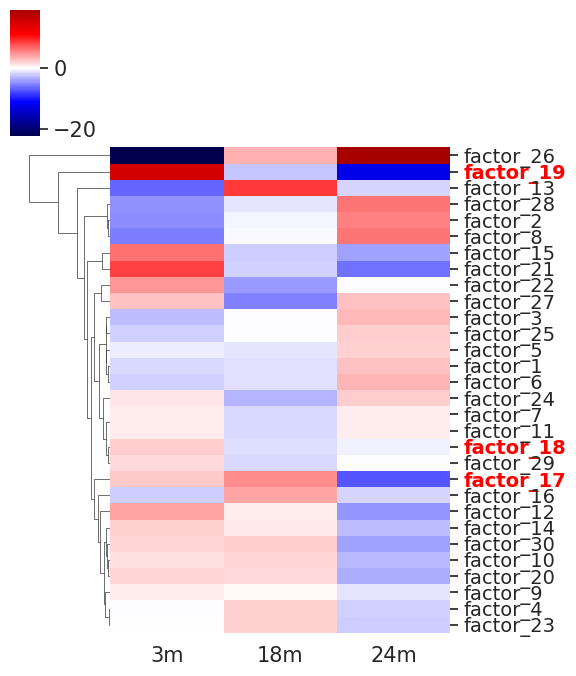

In [25]:
# Create the clustermap
g = sns.clustermap(coefficients_age.T, cmap="seismic", annot=False, figsize=(6, 7), row_cluster=True, col_cluster=False, xticklabels=1, yticklabels=1, center=0)

# Set y-axis tick labels (rows) font size and rotation
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=14)

# Set x-axis tick labels (columns) font size
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), fontsize=15)

# Disable color bar visibility
g.cax.set_visible(True)

# Highlight specific factors (rows)
highlighted_factors = ['factor_17', 'factor_18', 'factor_19']
for label in g.ax_heatmap.yaxis.get_majorticklabels():
    if label.get_text() in highlighted_factors:
        label.set_weight('bold')   # Make it bold
        label.set_color('red')     # Change color to red (you can choose any color)

# Set colorbar font size
g.cax.tick_params(labelsize=15)

date_str = datetime.now().strftime("%Y-%m-%d")
filename = f"factor_age_coefficients_{date_str}.pdf"
    
# Save the figure to a PDF
plt.savefig(filename, format='pdf')

# Show the plot
plt.show()

In [26]:
def get_unique_top_factors_by_group(coefficients_df, top_n=5):
    """
    Get top N unique factors across all groups (rows) in the coefficients DataFrame.
    
    Parameters:
    - coefficients_df: DataFrame with logistic regression coefficients.
    - top_n: Number of top factors to select for each group (row).
    
    Returns:
    - unique_factors: List of unique top factors across all groups.
    """
    top_factors_per_group = []
    
    # Step 1: Identify top N factors for each group (row)
    for group in coefficients_df.index:
        top_factors = coefficients_df.loc[group].abs().nlargest(top_n).index.tolist()
        top_factors_per_group.extend(top_factors)
    
    # Step 2: Get unique factors across all groups
    unique_factors = list(set(top_factors_per_group))
    
    return unique_factors

In [27]:
# Step 1: Assign numeric values to the age groups (in the order of the rows in the DataFrame)
age_mapping = {'3m': 3, '18m': 18, '24m': 24}
numeric_ages = coefficients_age.index.map(age_mapping)
correlations = coefficients_age.apply(lambda x: np.corrcoef(numeric_ages, x)[0, 1])
sorted_correlations = correlations.sort_values()
# Display the top 5 negatively and top 5 positively correlated factors
print("Top 5 Negatively Correlated Factors with Age:")
print(sorted_correlations.head(5))

print("\nTop 5 Positively Correlated Factors with Age:")
print(sorted_correlations.tail(5))

Top 5 Negatively Correlated Factors with Age:
factor_21   -0.999996
factor_19   -0.996928
factor_15   -0.992611
factor_12   -0.922671
factor_18   -0.867251
dtype: float64

Top 5 Positively Correlated Factors with Age:
factor_25    0.946448
factor_2     0.952035
factor_8     0.958348
factor_3     0.963200
factor_26    0.994927
dtype: float64


In [28]:
coefficients_age[["factor_21", "factor_8"]]

,factor_21,factor_8
3m,8.094963,-5.640909
18m,-2.001506,-0.315417
24m,-6.093456,5.956326


In [29]:
sorted_correlations["factor_21"], sorted_correlations["factor_26"]

(-0.9999957217464661, 0.9949271065011679)

In [30]:
def plot_top_factor_distributions(splice_adata, top_factors, age_column="age", plot_type="boxenplot", log_scale=False):
    """
    Plot distributions of cell factor contributions for top N factors with the largest coefficients
    from multinomial logistic regression across different age groups and save the plot as a PDF file.
    
    Parameters:
    - splice_adata: AnnData object containing the cell factor contributions.
    - top_factors: List of top factors to plot.
    - age_column: Column in splice_adata.obs representing the age groups (default="age").
    - plot_type: Type of plot to generate ("boxplot", "violinplot", "stripplot", "boxenplot", or "swarmplot").
    - log_scale: Boolean, whether to apply a logarithmic scale to the y-axis (default=False).
    """

    # Step 1: Extract factor contributions and age groups from splice_adata.obs
    data_combined = splice_adata.obs[top_factors + [age_column]]

    # Step 2: Melt the DataFrame for easier plotting
    data_melted = pd.melt(data_combined, id_vars=[age_column], var_name="Factor", value_name="Contribution")

    # Step 3: Plot distributions using the selected plot type
    plt.figure(figsize=(6, 5))

    if plot_type == "boxenplot":
        sns.boxenplot(x="Factor", y="Contribution", hue=age_column, data=data_melted)

        # Calculate and plot medians as red dots
        medians = data_melted.groupby(['Factor', age_column])['Contribution'].median().reset_index()
        # Iterate over each factor and age group and plot the median as a red dot
        for i, factor in enumerate(top_factors):
            for j, age in enumerate(medians[age_column].unique()):
                median_value = medians[(medians['Factor'] == factor) & (medians[age_column] == age)]['Contribution'].values
                if median_value.size > 0:
                    # Use plt.scatter to plot the median for each age group on the boxenplot
                    plt.scatter([i + (j * 0.1)], median_value, color='red', zorder=5, s=20)

    # Step 4: Apply logarithmic scale if requested
    if log_scale:
        plt.yscale("log")

    # Customize font sizes for labels and ticks
    plt.xlabel("Factors", fontsize=15)
    plt.ylabel("Factor Cell Activity", fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.legend(title="Age", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14)
    plt.tight_layout()

    # Step 5: Save plot as a PDF file with current date and factors in the filename
    date_str = datetime.now().strftime("%Y-%m-%d")
    factors_str = "_".join(top_factors)
    filename = f"factor_distributions_{factors_str}_{date_str}.pdf"
    
    # Save the figure to a PDF
    plt.savefig(filename, format='pdf')

    # Display the plot
    plt.show()

    print(f"Plot saved as {filename}")


/scratch/ipykernel_3048798/3112707271.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = data_melted.groupby(['Factor', age_column])['Contribution'].median().reset_index()


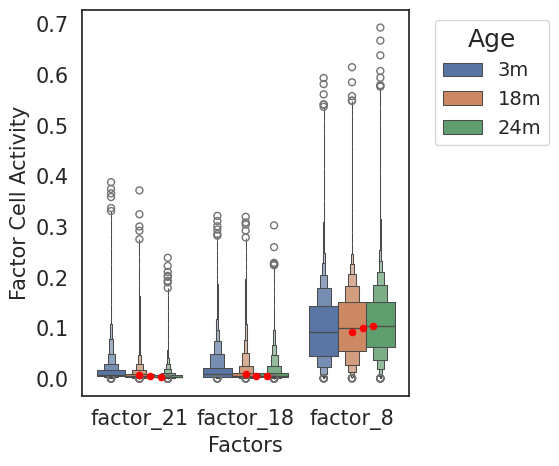

Plot saved as factor_distributions_factor_21_factor_18_factor_8_2024-11-14.pdf


In [31]:
plot_top_factor_distributions(splice_adata, top_factors=["factor_21", "factor_18", "factor_8"], age_column="age", plot_type="boxenplot")

In [32]:
# Step 1: Create the age_category column
def create_age_category(splice_adata):
    splice_adata.obs['age_category'] = splice_adata.obs['age'].map({
        '3m': 'young', 
        '18m': 'old', 
        '24m': 'old'
    })

# Step 2: Define function to calculate delta medians and p-values
def compare_factors_by_age(splice_adata, factors, cell_type_col="cell_type_grouped"):
    results = []
    
    # Iterate over unique cell types
    for cell_type in splice_adata.obs[cell_type_col].unique():
        # Subset cells by cell type
        cell_type_data = splice_adata[splice_adata.obs[cell_type_col] == cell_type]

        # Further subset into young and old groups
        young_cells = cell_type_data[cell_type_data.obs['age_category'] == 'young']
        old_cells = cell_type_data[cell_type_data.obs['age_category'] == 'old']

        # Iterate over factors
        for factor in factors:
            # Extract factor activity scores
            young_scores = young_cells.obs[factor].values
            old_scores = old_cells.obs[factor].values

            # Compute median for young and old
            young_median = pd.Series(young_scores).median()
            old_median = pd.Series(old_scores).median()
            
            # Compute the delta in medians
            delta_median = old_median - young_median

            # Perform Wilcoxon rank-sum test
            _, p_value = ranksums(young_scores, old_scores)

            # Append result to the list
            results.append({
                'cell_type': cell_type,
                'factor': factor,
                'delta_median': delta_median,
                'p_value': p_value
            })

    # Convert results into a DataFrame
    result_df = pd.DataFrame(results)
    
    return result_df

# Step 3: Example usage
create_age_category(splice_adata)

# Define the factors to analyze
K=30
factors = [f'factor_{i}' for i in range(1, K+1)]

# Call the function to get results
result_table = compare_factors_by_age(splice_adata, factors, cell_type_col='cell_type_grouped')

# Display the result table
print(result_table)

       cell_type     factor  delta_median       p_value
0      THYMOCYTE   factor_1     -0.034684  3.426103e-64
1      THYMOCYTE   factor_2      0.048850  2.062469e-42
2      THYMOCYTE   factor_3      0.032485  6.704362e-42
3      THYMOCYTE   factor_4     -0.001942  5.028983e-17
4      THYMOCYTE   factor_5     -0.000733  6.064746e-37
...          ...        ...           ...           ...
1105  VALVE CELL  factor_26     -0.000191  7.341313e-01
1106  VALVE CELL  factor_27     -0.001056  9.481281e-05
1107  VALVE CELL  factor_28     -0.000991  4.808162e-01
1108  VALVE CELL  factor_29     -0.000199  1.109411e-01
1109  VALVE CELL  factor_30      0.002217  8.960895e-03

[1110 rows x 4 columns]


In [33]:
# Step 1: Create the age_category column
def create_age_category(splice_adata):
    splice_adata.obs['age_category'] = splice_adata.obs['age'].map({
        '3m': 'young', 
        '18m': 'old', 
        '24m': 'old'
    })

# Step 2: Define function to calculate delta medians, average, and median activity scores
def compare_factors_by_age(splice_adata, factors, cell_type_col="cell_type_grouped"):
    results = []
    
    # Iterate over unique cell types
    for cell_type in splice_adata.obs[cell_type_col].unique():
        # Subset cells by cell type
        cell_type_data = splice_adata[splice_adata.obs[cell_type_col] == cell_type]

        # Further subset into young and old groups
        young_cells = cell_type_data[cell_type_data.obs['age_category'] == 'young']
        old_cells = cell_type_data[cell_type_data.obs['age_category'] == 'old']

        # Iterate over factors
        for factor in factors:
            # Extract factor activity scores for young and old
            young_scores = young_cells.obs[factor].values
            old_scores = old_cells.obs[factor].values

            # Compute median for young and old
            young_median = pd.Series(young_scores).median()
            old_median = pd.Series(old_scores).median()
            
            # Compute the delta in medians
            delta_median = old_median - young_median

            # Perform Wilcoxon rank-sum test
            _, p_value = ranksums(young_scores, old_scores)

            # Calculate average and median factor activity across all cells in the cell type
            avg_factor_activity = pd.Series(cell_type_data.obs[factor].values).mean()
            median_factor_activity = pd.Series(cell_type_data.obs[factor].values).median()

            # Append result to the list
            results.append({
                'cell_type': cell_type,
                'factor': factor,
                'delta_median': delta_median,
                'p_value': p_value,
                'avg_factor_activity': avg_factor_activity,
                'median_factor_activity': median_factor_activity
            })

    # Convert results into a DataFrame
    result_df = pd.DataFrame(results)
    
    return result_df

# Step 3: Example usage
create_age_category(splice_adata)

# Define the factors to analyze
K = 30
factors = [f'factor_{i}' for i in range(1, K+1)]

# Call the function to get results
result_table = compare_factors_by_age(splice_adata, factors, cell_type_col='cell_type_grouped')

# Display the result table
print(result_table)


       cell_type     factor  delta_median       p_value  avg_factor_activity  \
0      THYMOCYTE   factor_1     -0.034684  3.426103e-64             0.224235   
1      THYMOCYTE   factor_2      0.048850  2.062469e-42             0.106536   
2      THYMOCYTE   factor_3      0.032485  6.704362e-42             0.085365   
3      THYMOCYTE   factor_4     -0.001942  5.028983e-17             0.012589   
4      THYMOCYTE   factor_5     -0.000733  6.064746e-37             0.004236   
...          ...        ...           ...           ...                  ...   
1105  VALVE CELL  factor_26     -0.000191  7.341313e-01             0.009261   
1106  VALVE CELL  factor_27     -0.001056  9.481281e-05             0.005211   
1107  VALVE CELL  factor_28     -0.000991  4.808162e-01             0.012472   
1108  VALVE CELL  factor_29     -0.000199  1.109411e-01             0.004529   
1109  VALVE CELL  factor_30      0.002217  8.960895e-03             0.017590   

      median_factor_activity  
0       

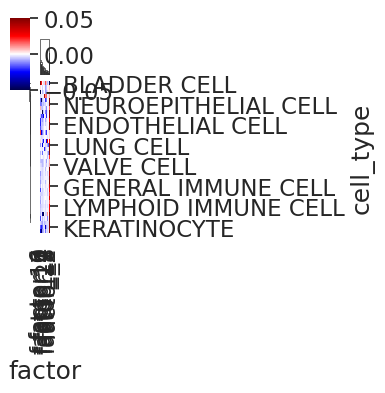

In [34]:
# Step 1: Create a pivot table for delta_median and avg_factor_activity
delta_median_pivot = result_table.pivot(index='cell_type', columns='factor', values='delta_median')
avg_activity_pivot = result_table.pivot(index='cell_type', columns='factor', values='avg_factor_activity')
median_activity_pivot = result_table.pivot(index='cell_type', columns='factor', values='median_factor_activity')

# Step 2: Masking cells with median activity <= 0.001 for delta_median
# mask = avg_activity_pivot < 0.01

# Step 3: Define a colormap that includes black for masked cells
cmap = sns.color_palette("seismic", as_cmap=True)
cmap.set_bad(color='grey')  # Set masked values to black

# Step 3: Cluster the delta_median_pivot to get row and column order
g = sns.clustermap(delta_median_pivot, cmap="seismic", cbar=True, 
                   annot=False, center=0, vmin=-0.05, vmax=0.05, figsize=(4, 4),
                   row_cluster=True, col_cluster=True)

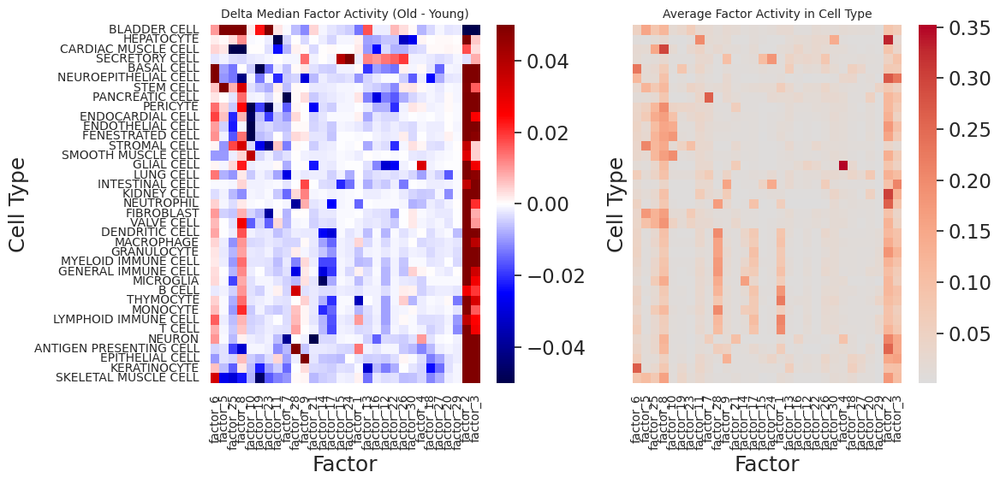

In [35]:
# Extract the cluster order from the clustermap
cell_type_order = g.dendrogram_row.reordered_ind
factor_order = g.dendrogram_col.reordered_ind

# Reindex avg_activity_pivot to match the clustered order of delta_median_pivot
avg_activity_pivot = avg_activity_pivot.iloc[cell_type_order, factor_order]
delta_median_pivot = delta_median_pivot.iloc[cell_type_order, factor_order]  # Reorder this as well

# Step 4: Create a figure for two side-by-side heatmaps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Step 5: Plot the delta_median_pivot heatmap with the clustering-based order
sns.heatmap(delta_median_pivot, cmap="seismic", ax=ax1, cbar=True, 
            annot=False, center=0, vmin=-0.05, vmax=0.05, xticklabels=True, yticklabels=True)

# Step 6: Plot the avg_activity_pivot heatmap with the same order as delta_median_pivot
sns.heatmap(avg_activity_pivot, cmap="coolwarm", ax=ax2, cbar=True, 
            annot=False, center=0, vmin=avg_activity_pivot.min().min(), vmax=avg_activity_pivot.max().max(), 
            xticklabels=True, yticklabels=False)  # Show x-axis ticks but hide y-axis ticks

# Step 7: Set titles for the plots
ax1.set_title('Delta Median Factor Activity (Old - Young)', fontsize=10)
ax2.set_title('Average Factor Activity in Cell Type', fontsize=10)

# Step 8: Set x-axis and y-axis labels for the left plot (since it's clustered) 
ax1.set_xticklabels(delta_median_pivot.columns, rotation=90, fontsize=10)
ax1.set_yticklabels(delta_median_pivot.index, rotation=0, fontsize=10)
ax1.set_ylabel("Cell Type")
ax1.set_xlabel("Factor")

# Set x-axis labels for the right plot (factors should be shown)
ax2.set_xticklabels(avg_activity_pivot.columns, rotation=90, fontsize=10)
ax2.set_ylabel("Cell Type")
ax2.set_xlabel("Factor")

# Adjust layout
plt.tight_layout()

# Step 5: Save the figure as a PDF with filename including current date
current_date = datetime.now().strftime("%Y-%m-%d")
filename = f"supp_heatmaps_delta_avg_factors_{current_date}.pdf"
plt.savefig(filename, format='pdf')

plt.show()

In [36]:
splice_adata.var[["Cluster", "CountJuncs"]].drop_duplicates().CountJuncs.median()

3.0

In [37]:
# Function to plot the distribution of factor activity for young and old mice
def plot_factor_distribution(splice_adata, cell_type, factor):
    # Filter data by the given cell type
    cell_type_data = splice_adata[splice_adata.obs['cell_type_grouped'] == cell_type]
    
    # Split the data into young and old groups
    young_data = cell_type_data[cell_type_data.obs['age_category'] == 'young']
    old_data = cell_type_data[cell_type_data.obs['age_category'] == 'old']
    
    # Extract factor values for both groups
    young_scores = young_data.obs[factor].values
    old_scores = old_data.obs[factor].values
    
    # Create the plot
    plt.figure(figsize=(10, 6))
    
    # Plot the distribution for young mice
    sns.kdeplot(young_scores, label="Young", color="blue", shade=True)
    
    # Plot the distribution for old mice
    sns.kdeplot(old_scores, label="Old", color="red", shade=True)
    
    # Plot the median for young
    young_median = pd.Series(young_scores).median()
    plt.axvline(young_median, color="blue", linestyle="--", label=f'Young Median: {young_median:.2f}')
    
    # Plot the median for old
    old_median = pd.Series(old_scores).median()
    plt.axvline(old_median, color="red", linestyle="--", label=f'Old Median: {old_median:.2f}')
    
    # Set plot title and labels
    plt.title(f"Factor {factor} Distribution for {cell_type} (Young vs Old)", fontsize=16)
    plt.xlabel(f"{factor} Activity Score", fontsize=14)
    plt.ylabel("Density", fontsize=14)
    
    # Add legend
    plt.legend()
    
    # Display the plot
    plt.tight_layout()
    plt.show()

In [38]:
# Function to plot the distribution of factor activity for 3m, 18m, and 24m age groups
def plot_factor_distribution_by_age(splice_adata, factor, cell_type=None):
    
    if cell_type is not None:
        # Filter data by the given cell type
        cell_type_data = splice_adata[splice_adata.obs['cell_type_grouped'] == cell_type]
    
    else:
        cell_type_data = splice_adata

    # Define age groups
    age_groups = ['3m', '18m', '24m']
    colors = {'3m': 'blue', '18m': 'green', '24m': 'red'}
    
    # Create the plot
    plt.figure(figsize=(6, 6))
    
    # Plot the distribution for each age group
    for age in age_groups:
        age_data = cell_type_data[cell_type_data.obs['age'] == age]
        scores = age_data.obs[factor].values
        
        # Plot the distribution (KDE)
        sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
        
        # Plot the median for each age group
        median = pd.Series(scores).median()
        plt.axvline(median, color=colors[age], linestyle="--", label=f'{age} Median: {median:.2f}')
    
    # Set plot title and labels
    plt.title(f"Factor {factor} Distribution for {cell_type}", fontsize=17)
    plt.xlabel(f"{factor} Activity Score", fontsize=16)
    plt.ylabel("Density", fontsize=16)
    
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    plt.xlim(0, 1)
    # Add legend
    plt.legend()
    
    # Display the plot
    plt.tight_layout()
    plt.savefig(f"Factor_{factor}_{cell_type}_Cell_Distribution_Activity.pdf", format="pdf")  # Save as PDF

    plt.show()

/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)


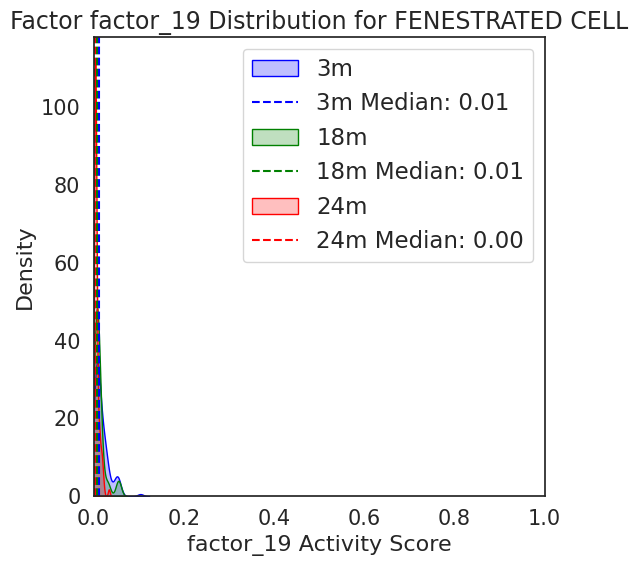

In [39]:
# Example usage
plot_factor_distribution_by_age(splice_adata, "factor_19", "FENESTRATED CELL")

/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)


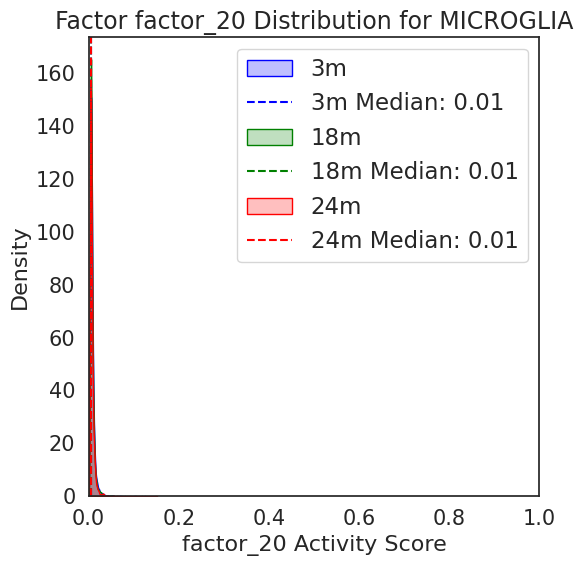

In [40]:
plot_factor_distribution_by_age(splice_adata, "factor_20", "MICROGLIA")

/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)


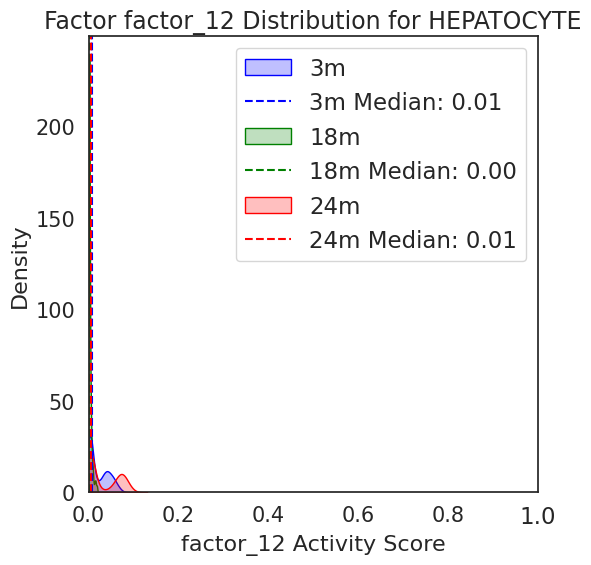

In [41]:
plot_factor_distribution_by_age(splice_adata, "factor_12", "HEPATOCYTE")

/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)
/scratch/ipykernel_3048798/1627924367.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(scores, label=f"{age}", color=colors[age], shade=True)


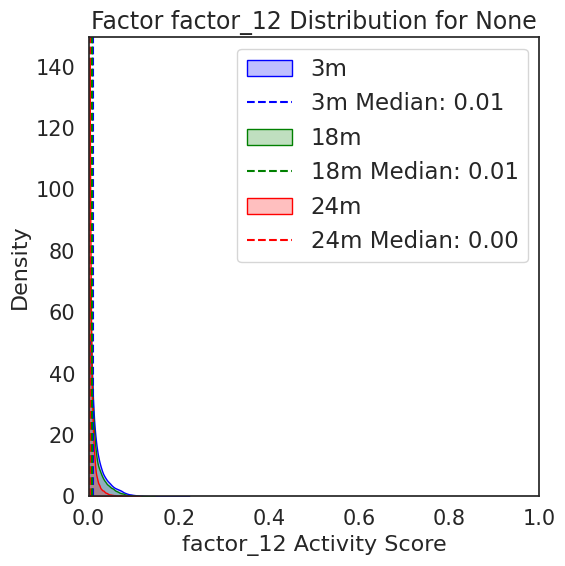

In [42]:
plot_factor_distribution_by_age(splice_adata, "factor_12", None)

/scratch/ipykernel_3048798/2672929541.py:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(young_scores, label="Young", color="blue", shade=True)
/scratch/ipykernel_3048798/2672929541.py:21: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(old_scores, label="Old", color="red", shade=True)


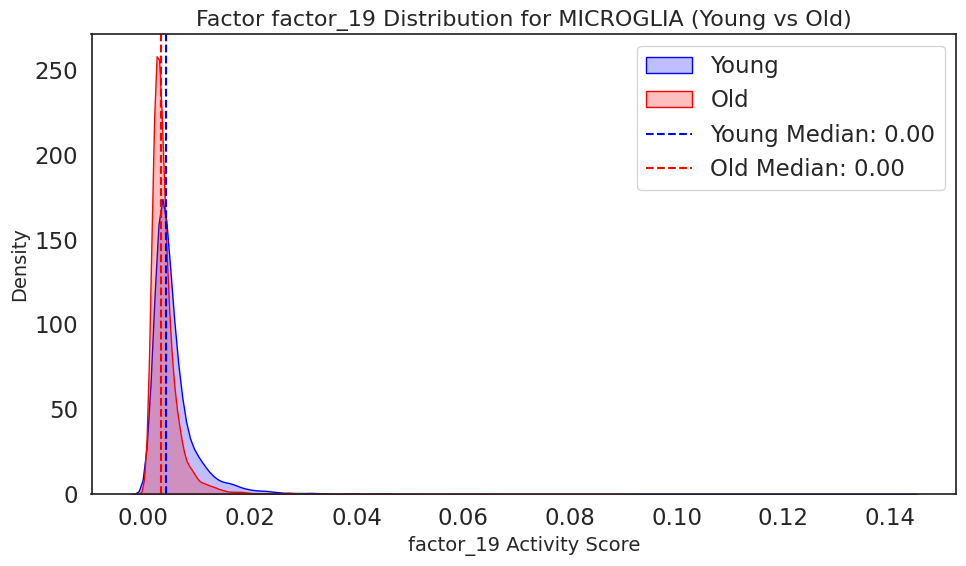

In [43]:
# Example usage
plot_factor_distribution(splice_adata, "MICROGLIA", "factor_19")

In [44]:
def linear_regression_age_prediction(splice_adata, K=50, test_size=0.2, random_state=42):
    """
    Train and evaluate a multivariate linear regression model using latent factors
    from splice_adata to predict age. Returns RMSE, trained model, and coefficients
    with confidence intervals.
    
    Parameters:
    - splice_adata: AnnData object containing the data
    - K: int, number of latent factors to use for regression
    - test_size: float, proportion of the data to use for testing
    - random_state: int, seed for reproducibility
    
    Returns:
    - rmse: float, Root Mean Squared Error on the test set
    - coefficients_df: Pandas DataFrame with linear regression coefficients
    """
        
    # Extract latent factors and target (age) variable
    data_combined = splice_adata.obs
    latent_factors = [f'factor_{i}' for i in range(1, K + 1)]
    X = data_combined[latent_factors]
    y = data_combined['age_numeric']

    # Add intercept for statsmodels
    X = sm.add_constant(X)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Train a multivariate linear regression model
    linreg = sm.OLS(y_train, X_train).fit()

    # Evaluate the model on the test set
    y_pred = linreg.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"Age Prediction RMSE: {rmse:.4f}")

    # Train the model on the full dataset for coefficient analysis
    linreg_full = sm.OLS(y, X).fit()

    # Get the linear regression coefficients, confidence intervals, and p-values
    coefficients = linreg_full.params
    conf_intervals = linreg_full.conf_int()
    std_errors = linreg_full.bse

    # Create a DataFrame with coefficients and confidence intervals
    coefficients_df = pd.DataFrame({
        'Factor': ['Intercept'] + latent_factors,
        'Coefficient': coefficients,
        'Lower CI': conf_intervals[0],
        'Upper CI': conf_intervals[1],
        'Standard Error': std_errors
    })

    return rmse, coefficients_df

In [45]:
# Step 1: Convert age categories to numerical values (3m -> 3, 18m -> 18, 24m -> 24)
age_map = {'3m': 1, '18m': 2, '24m': 3}
splice_adata.obs['age_numeric'] = splice_adata.obs['age'].map(age_map).astype(int)

splice_adata.obs['age_numeric'].values

array([1, 3, 2, ..., 1, 1, 1])

In [46]:
# Example usage
rmse, coefficients_df = linear_regression_age_prediction(splice_adata, K=30)

Age Prediction RMSE: 0.6865


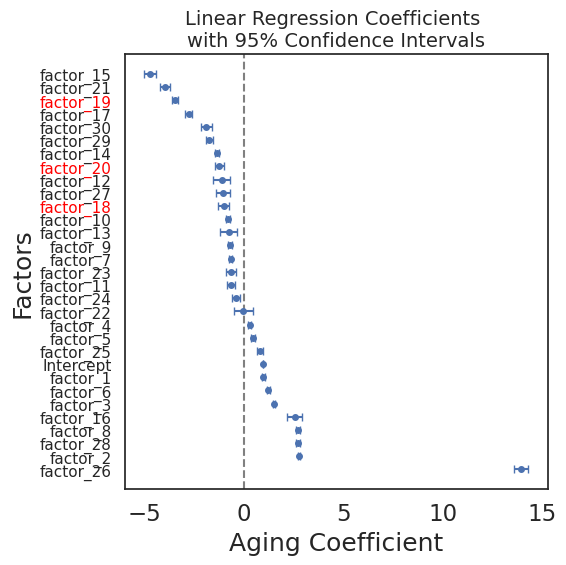

In [47]:
# Sort the DataFrame by coefficient in descending order
coefficients_df = coefficients_df.sort_values(by='Coefficient', ascending=False)

# Define the factors to highlight in red
highlight_factors = ['factor_18', 'factor_19', 'factor_20']

# Plot coefficients with confidence intervals (horizontal plot)
plt.figure(figsize=(6, 6))
plt.errorbar(coefficients_df['Coefficient'], coefficients_df['Factor'],
             xerr=1.96 * coefficients_df['Standard Error'], fmt='o', capsize=3, markersize=4)

# Add a vertical line at x = 0 for reference
plt.axvline(0, color='gray', linestyle='--')

# Set labels and title
plt.title('Linear Regression Coefficients \nwith 95% Confidence Intervals', fontsize=14)
plt.xlabel('Aging Coefficient')
plt.ylabel('Factors')

# Adjust the font size of the y-axis tick labels
plt.yticks(fontsize=11)

# Change the font color of specific y-axis tick labels
ax = plt.gca()
y_ticks = ax.get_yticklabels()
for tick in y_ticks:
    if tick.get_text() in highlight_factors:
        tick.set_color('red')  # Set the color to red for the specified factors

# Adjust layout for better fit
plt.tight_layout()
plt.savefig("linear_regression_factors_aging.pdf", format='pdf')

# Display the plot
plt.show()

In [48]:
# Select columns that contain "factor" in their name and ensure they are numeric
factor_columns = splice_adata.obs.filter(like='factor')

# Convert the selected factor columns to numeric, if they are not already
for col in factor_columns.columns:
    splice_adata.obs[col] = pd.to_numeric(splice_adata.obs[col], errors='coerce')

# Group by age and calculate the median for these factor columns
age_groups = splice_adata.obs.groupby('age_category')[factor_columns.columns].median()

# Compute the delta between 3m, 18m, and 24m for each factor
deltas = pd.DataFrame({
    'Factor': [f'factor_{i}' for i in range(1, K + 1)],
    'Delta_OY': age_groups.loc['old'] - age_groups.loc['young']
})

coefficients_with_deltas = deltas.merge(coefficients_df)

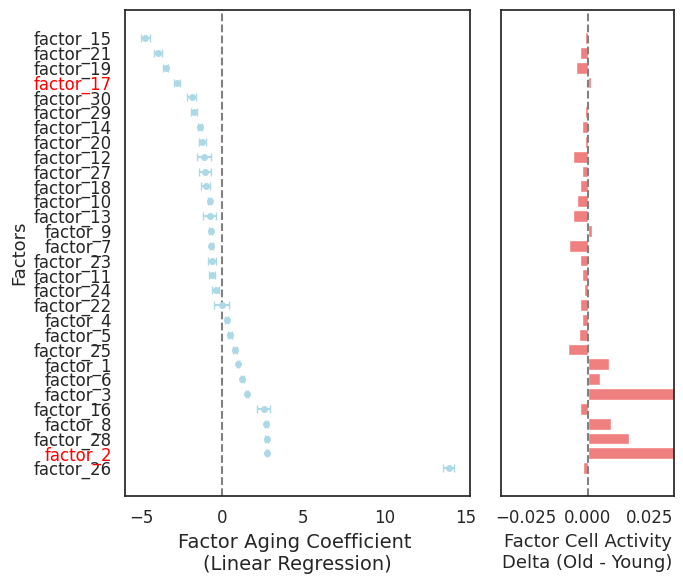

In [49]:
# Set global font size for the entire plot
plt.rcParams.update({'font.size': 12})

# Sort the DataFrame by coefficient in descending order
coefficients_with_deltas = coefficients_with_deltas.sort_values(by='Coefficient', ascending=False)

# Factors to highlight in red
highlight_factors = ['factor_17', 'factor_2']

# Create figure with two subplots (side by side)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 6), gridspec_kw={'width_ratios': [2, 1]}, sharey=True)

# Plot 1: Coefficients with error bars using plt.errorbar
ax1.errorbar(coefficients_with_deltas['Coefficient'], coefficients_with_deltas['Factor'],
             xerr=1.96 * coefficients_with_deltas['Standard Error'], fmt='o', capsize=3, markersize=4, color='lightblue')

# Add a vertical line at x = 0 for reference
ax1.axvline(0, color='gray', linestyle='--')

# Set axis labels and title
ax1.set_xlabel('Factor Aging Coefficient \n(Linear Regression)', fontsize=14)
ax1.set_ylabel('Factors', fontsize=13)

# Highlight specific factors in red
y_ticks = ax1.get_yticklabels()
for tick in y_ticks:
    if tick.get_text() in highlight_factors:
        tick.set_color('red')

# Plot 2: Delta (Old - Young) 
ax2.barh(y=coefficients_with_deltas['Factor'], width=coefficients_with_deltas['Delta_OY'], 
         color='lightcoral', label='Delta YO')
ax2.axvline(0, color='gray', linestyle='--')

# Set axis labels and title for delta plot
ax2.set_xlabel('Factor Cell Activity\nDelta (Old - Young)', fontsize=13)
ax2.set_xlim(-0.035, 0.035)

# Adjust font size of tick labels for both axes
ax1.tick_params(axis='both', which='major', labelsize=12)
ax2.tick_params(axis='both', which='major', labelsize=12)

# Adjust layout
plt.tight_layout()

# Save as pdf 
plt.savefig("linear_regression_factors_aging_with_delta.pdf", format='pdf')

# Show the plot
plt.show()

<Axes: xlabel='age', ylabel='factor_17'>

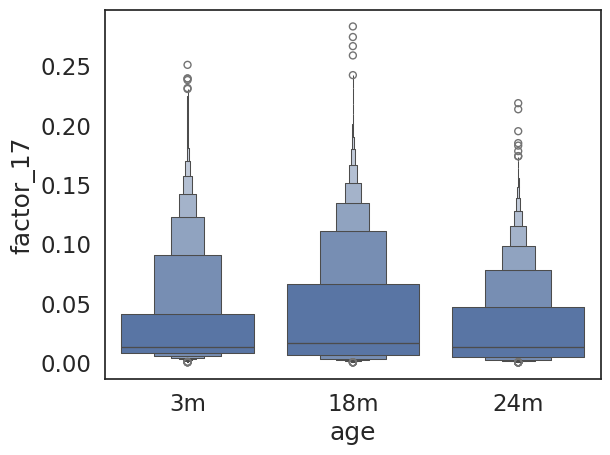

In [50]:
sns.boxenplot(splice_adata.obs, x="age", y="factor_17")

<Axes: xlabel='age', ylabel='factor_2'>

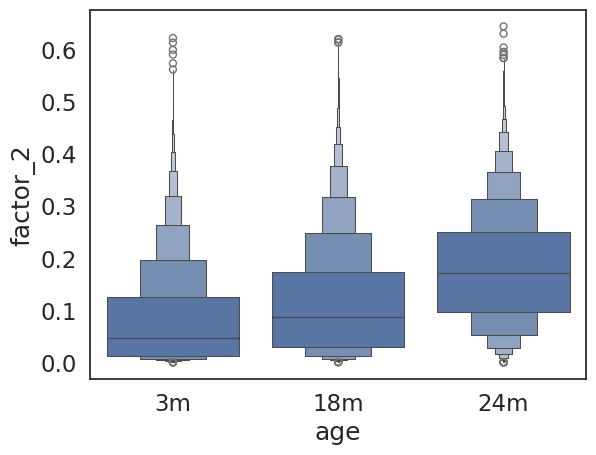

In [51]:
sns.boxenplot(splice_adata.obs, x="age", y="factor_2")

In [52]:
result_table

,cell_type,factor,delta_median,p_value,avg_factor_activity,median_factor_activity
0,THYMOCYTE,factor_1,-0.034684,3.426103e-64,0.224235,0.231701
1,THYMOCYTE,factor_2,0.048850,2.062469e-42,0.106536,0.093387
2,THYMOCYTE,factor_3,0.032485,6.704362e-42,0.085365,0.058781
3,THYMOCYTE,factor_4,-0.001942,5.028983e-17,0.012589,0.007989
4,THYMOCYTE,factor_5,-0.000733,6.064746e-37,0.004236,0.003453
...,...,...,...,...,...,...
1105,VALVE CELL,factor_26,-0.000191,7.341313e-01,0.009261,0.007211
1106,VALVE CELL,factor_27,-0.001056,9.481281e-05,0.005211,0.003374
1107,VALVE CELL,factor_28,-0.000991,4.808162e-01,0.012472,0.008544
1108,VALVE CELL,factor_29,-0.000199,1.109411e-01,0.004529,0.002911


In [53]:
# Assuming the following two DataFrames are available:
# factors_df: contains factor coefficients from regression model
# cell_type_df: contains factor activity differences between young and old across cell types

# Step 1: Adjust p-values using FDR correction (Benjamini-Hochberg)
# Add FDR-adjusted p-values to the cell_type_df
_, result_table['p_value_fdr'] = fdrcorrection(result_table['p_value'])

# Merge the two tables on the 'Factor' column
merged_df = pd.merge(result_table, coefficients_df, how='inner', left_on='factor', right_on='Factor')
threshold = 2 

# Step 1: Filter for significant factors (e.g., p-value < 0.05)
# Step 3: Filter for significant factors based on FDR-adjusted p-values and absolute delta_median > 0.05
significant_factors = merged_df[
    (merged_df['p_value_fdr'] < 0.05) & 
    (merged_df['delta_median'].abs() > 0.05)
]

# Step 2: Group by factor and summarize the number of cell types where the factor is significantly different
factor_summary = significant_factors.groupby('factor').agg(
    num_significant_cell_types=('cell_type', 'count'),  # Count how many cell types show significant changes
    avg_delta_median=('delta_median', 'mean'),          # Average delta_median across all cell types
    min_delta_median=('delta_median', 'min'),           # Minimum delta_median (enriched in young)
    max_delta_median=('delta_median', 'max'),           # Maximum delta_median (enriched in old)
    avg_coefficient=('Coefficient', 'mean')             # Average age coefficient from linear regression
).reset_index()

# Step 3: Identify factors that are commonly enriched (shared across many cell types)
shared_factors = factor_summary[factor_summary['num_significant_cell_types'] > threshold]  # Set a threshold, e.g., > 5 cell types

# Step 4: Identify factors that are strongly enriched in a subset (i.e., large delta in some cell types)
subset_enriched_factors = factor_summary[factor_summary['num_significant_cell_types'] <= threshold]

# Step 5: Sort the results for better readability
shared_factors = shared_factors.sort_values(by='num_significant_cell_types', ascending=False)
subset_enriched_factors = subset_enriched_factors.sort_values(by='avg_delta_median', ascending=False)

# Display the summary
print("Factors Shared Across Many Cell Types:")
print(shared_factors)

print("\nFactors Strongly Enriched in a Subset of Cell Types:")
print(subset_enriched_factors)

Factors Shared Across Many Cell Types:
     factor  num_significant_cell_types  avg_delta_median  min_delta_median  \
3  factor_2                          26          0.083035         -0.072895   
8  factor_3                          14          0.072459         -0.050782   

   max_delta_median  avg_coefficient  
3          0.170482         2.776819  
8          0.129885         1.507918  

Factors Strongly Enriched in a Subset of Cell Types:
       factor  num_significant_cell_types  avg_delta_median  min_delta_median  \
10   factor_6                           1          0.112314          0.112314   
9    factor_5                           2          0.111210          0.077647   
7   factor_25                           1          0.090402          0.090402   
5   factor_23                           1          0.066393          0.066393   
6   factor_24                           1          0.062190          0.062190   
13   factor_9                           1          0.052702       

In [54]:
shared_factors

,factor,num_significant_cell_types,avg_delta_median,min_delta_median,max_delta_median,avg_coefficient
3,factor_2,26,0.083035,-0.072895,0.170482,2.776819
8,factor_3,14,0.072459,-0.050782,0.129885,1.507918


In [55]:
fact19_age = result_table[result_table["factor"] == "factor_19"].sort_values(by="delta_median")
fact15_age = result_table[result_table["factor"] == "factor_15"].sort_values(by="delta_median")
fact12_age = result_table[result_table["factor"] == "factor_12"].sort_values(by="delta_median")
fact2_age = result_table[result_table["factor"] == "factor_2"].sort_values(by="delta_median")
fact14_age = result_table[result_table["factor"] == "factor_14"].sort_values(by="delta_median")

In [56]:
# Create a bar plot to visualize the delta_median
def plot_factor_medians(factor_data, factor_name):
    plt.figure(figsize=(7,6))

    # Create a bar plot with delta_median values
    sns.barplot(
        x='delta_median', 
        y='cell_type', 
        data=factor_data, 
        palette='coolwarm',
        edgecolor='black'
    )
    
    # Set plot title and labels
    plt.title(f"Factor {factor_name} - Delta Median Activity", fontsize=15)
    plt.xlabel('Delta Median (Old - Young)', fontsize=16)
    plt.ylabel('Cell Type', fontsize=16)

   # Adjust tick font sizes
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=11)

    # Invert y-axis to display cell types top to bottom in the order of the DataFrame
    plt.gca().invert_yaxis()

    plt.tight_layout()
    plt.savefig(f"Factor_{factor_name}_Delta_Median_Activity.pdf", format="pdf")  # Save as PDF
    plt.show()

/scratch/ipykernel_3048798/1976681230.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


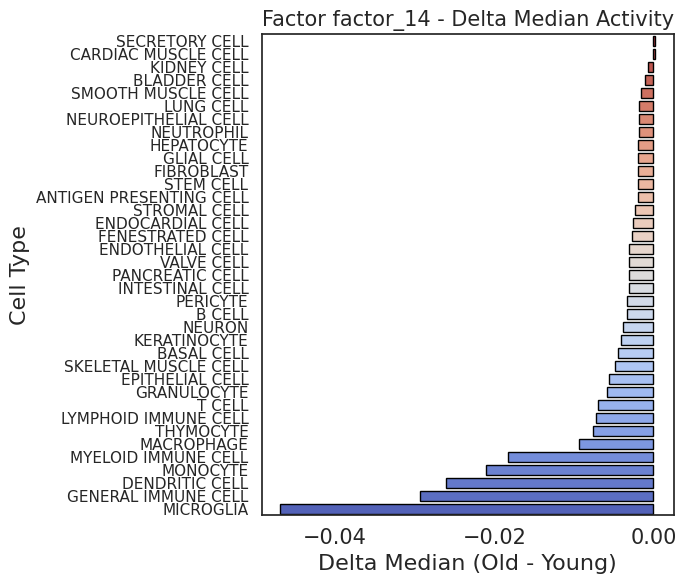

In [57]:
plot_factor_medians(fact14_age, 'factor_14')

/scratch/ipykernel_3048798/1976681230.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


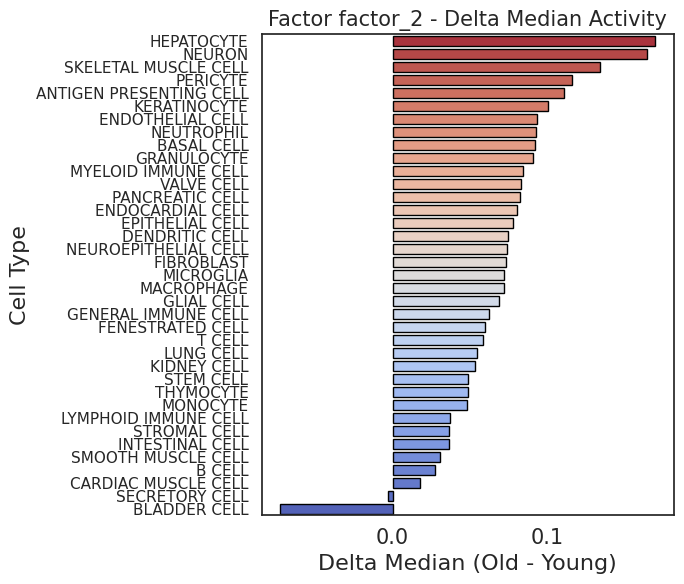

In [58]:
plot_factor_medians(fact2_age, 'factor_2')

In [59]:
# Assuming splice_adata is your AnnData object and the latent factors are stored in `splice_adata.obs`
feature = "cell_type_grouped"
K = 30  # Number of latent factors
# Call the function
accuracy, coefficients_cell_type = logistic_regression_feature_prediction(splice_adata, feature, K)
# Check the accuracy and coefficients
print(f"Accuracy for {feature}: {accuracy}")

Cell_type_grouped Prediction Accuracy: 0.6378
Accuracy for cell_type_grouped: 0.6378060263653484


In [60]:
# For each cell type, we will take the top 10 factors by absolute coefficient value.
top_factors_by_cell_type = coefficients_cell_type.apply(lambda x: x.abs().nlargest(5).index.tolist(), axis=1)

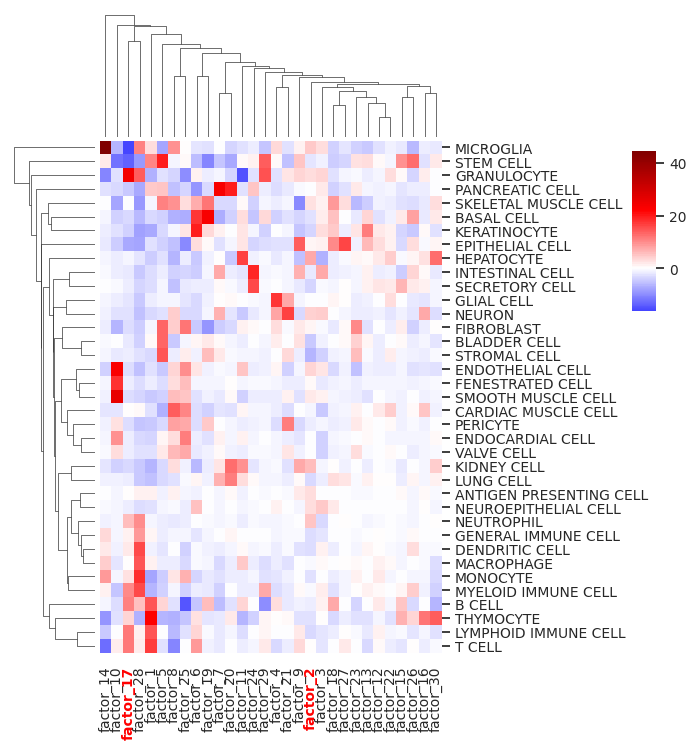

In [61]:
# Create the clustermap
g = sns.clustermap(coefficients_cell_type, cmap="seismic", annot=False, figsize=(8, 8), row_cluster=True, col_cluster=True, xticklabels=1, yticklabels=1, center=0)

# Set y-axis tick labels (rows) font size and rotation
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=10)

# Set x-axis tick labels (columns) font size
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), fontsize=10)

# Disable color bar visibility
g.cax.set_visible(True)

# Highlight specific factors (rows)
highlighted_factors = ['factor_2', 'factor_17']
for label in g.ax_heatmap.xaxis.get_majorticklabels():
    if label.get_text() in highlighted_factors:
        label.set_weight('bold')   # Make it bold
        label.set_color('red')     # Change color to red (you can choose any color)

# Set colorbar font size
g.cax.tick_params(labelsize=10)
# Adjust the colorbar size by changing its position
g.cax.set_position([0.8, 0.6, 0.03, 0.2])  # [left, bottom, width, height]

date_str = datetime.now().strftime("%Y-%m-%d")
filename = f"factor_cell_type_coefficients_{date_str}.pdf"
    
# Save the figure to a PDF
plt.savefig(filename, format='pdf')

# Show the plot
plt.show()

In [62]:
shuffled_indices = np.random.permutation(splice_adata.obs.index)
shuffled_adata = splice_adata[shuffled_indices, :]

In [63]:
top_factors_by_cell_type["STEM CELL"]

['factor_5', 'factor_29', 'factor_17', 'factor_26', 'factor_10']

/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


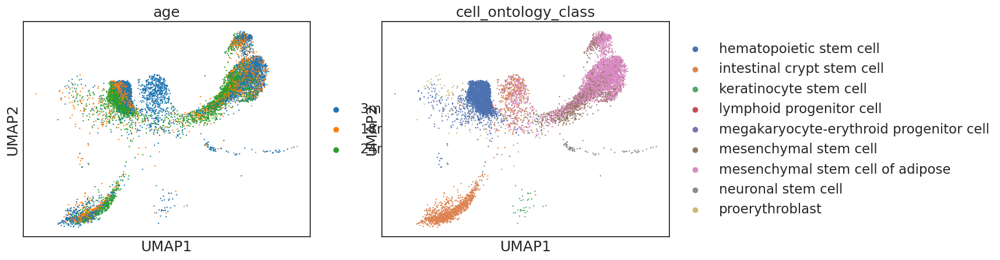

In [64]:
sc.pl.umap(shuffled_adata[shuffled_adata.obs["cell_type_grouped"] == "STEM CELL"], color=["age", "cell_ontology_class"])

In [65]:
smooth_psi = assign_post @ psi_learned
splice_adata.layers["smooth_psi"] = smooth_psi
splice_adata.var_names = splice_adata.var["junction_id"]

In [66]:
# Get UMAP based on assign_post embeddings in splice_data.obs columns with "factor" in them 
# Plot UMAP coloring just one age group at a time 

# Step 1: Extract the assign_post embeddings from splice_data.obs
# Get all columns with 'factor' in their names
factor_columns = [col for col in splice_adata.obs.columns if 'factor' in col]
embedding = splice_adata.obs[factor_columns].values

print(embedding.shape)

# Step 2: Perform UMAP on the factor embeddings
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
umap_embedding = reducer.fit_transform(embedding)
splice_adata.obsm['X_umap'] = umap_embedding

(106199, 30)


/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [67]:
# Step 1: Filter splice_adata for microglia cells
# Assuming 'cell_type' column in splice_adata.obs contains cell types
factor_columns = [col for col in splice_adata.obs.columns if 'factor' in col]
microglia_cells = splice_adata.obs[splice_adata.obs['cell_type_grouped'] == 'MICROGLIA'].index
splice_adata_microglia = splice_adata[microglia_cells, :]

# Step 2: Extract assign_post embeddings from splice_adata.obs for microglia cells
embedding = splice_adata_microglia.obs[factor_columns].values

# Step 3: Perform UMAP on the factor embeddings for microglia cells
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
umap_embedding = reducer.fit_transform(embedding)

# Add UMAP results back to splice_adata_microglia
splice_adata_microglia.obsm['X_umap'] = umap_embedding

/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ipykernel_3048798/3719818030.py:15: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
  splice_adata_microglia.obsm['X_umap'] = umap_embedding


In [68]:
top_factors_by_cell_type["MICROGLIA"]

['factor_14', 'factor_17', 'factor_28', 'factor_8', 'factor_5']

In [ ]:
# Make UMAP on all splicing factor/cells and color by main cell type group and age group 
# sc.pl.umap(shuffled_adata, color=["cell_type_grouped", "age"], ncols=2)

In [69]:
# Step 1: Identify the 15 most frequent cell types
cell_type_counts = shuffled_adata.obs['cell_type_grouped'].value_counts()
top_15_cell_types = cell_type_counts.index[:15]

# Step 2: Create a new column to assign color groups
shuffled_adata.obs['cell_type_colored'] = shuffled_adata.obs['cell_type_grouped'].apply(
    lambda x: x if x in top_15_cell_types else 'Other'
)

palette_tab20 = sns.color_palette("tab20", n_colors=15)

# Get a color palette for the top 15 cell types
cmap = cm.get_cmap("tab20", 15)  # Generates 15 distinct colors from the "tab20" colormap
colors_from_cmap = [cmap(i) for i in range(cmap.N)]  # Get the actual RGB values for each color

custom_colors = {cell_type: colors_from_cmap[i] for i, cell_type in enumerate(top_15_cell_types)}
custom_colors['Other'] = 'grey'

/scratch/ipykernel_3048798/847016185.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  shuffled_adata.obs['cell_type_colored'] = shuffled_adata.obs['cell_type_grouped'].apply(
/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/scratch/ipykernel_3048798/847016185.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("tab20", 15)  # Generates 15 distinct colors from the "tab20" colormap


In [ ]:
# Plot UMAP with custom colors and smaller legend font size
sc.pl.umap(shuffled_adata, color="cell_type_colored", palette=custom_colors, 
           legend_fontsize='small', show=False,
           size=10)  # Adjust size to make markers smaller if too many dots

# Save the plot as a PDF in a memory-efficient way
plt.savefig("umap_LeafletFA_cell_types_plot.pdf", dpi=150, format='pdf', bbox_inches='tight', transparent=True)

plt.show()
plt.close()

In [70]:
# Step 1: Identify the 15 most frequent cell types
cell_type_counts = shuffled_adata.obs['cell_type_grouped'].value_counts()
top_15_cell_types = cell_type_counts.index[:15]

# Step 2: Create a new column to assign color groups
adata.obs['cell_type_colored'] = adata.obs['cell_type_grouped'].apply(
    lambda x: x if x in top_15_cell_types else 'Other'
)

In [ ]:
# Plot UMAP with custom colors and smaller legend font size
sc.pl.umap(adata, color="cell_type_colored", palette=custom_colors, 
           legend_fontsize='small', show=False,
           size=10)  # Adjust size to make markers smaller if too many dots

# Save the plot as a PDF in a memory-efficient way
plt.savefig("umap_GeneExpression_cell_types_plot.pdf", dpi=150, format='pdf', bbox_inches='tight', transparent=True)

plt.show()
plt.close()

In [71]:
splice_adata[splice_adata.obs["cell_type_grouped"] == "MICROGLIA"]

View of AnnData object with n_obs × n_vars = 12796 × 64882
    obs: 'cell_id', 'age', 'batch', 'cell_ontology_class', 'method', 'mouse.id', 'sex', 'tissue', 'old_cell_id_index', 'cell_clean', 'cell_id_index', 'subtissue_clean', 'cell_type_grouped', 'factor_1', 'factor_2', 'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8', 'factor_9', 'factor_10', 'factor_11', 'factor_12', 'factor_13', 'factor_14', 'factor_15', 'factor_16', 'factor_17', 'factor_18', 'factor_19', 'factor_20', 'factor_21', 'factor_22', 'factor_23', 'factor_24', 'factor_25', 'factor_26', 'factor_27', 'factor_28', 'factor_29', 'factor_30', 'age_category', 'age_numeric'
    var: 'factor_0', 'factor_1', 'factor_2', 'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8', 'factor_9', 'factor_10', 'factor_11', 'factor_12', 'factor_13', 'factor_14', 'factor_15', 'factor_16', 'factor_17', 'factor_18', 'factor_19', 'factor_20', 'factor_21', 'factor_22', 'factor_23', 'factor_24', 'factor_25', 'fa

/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


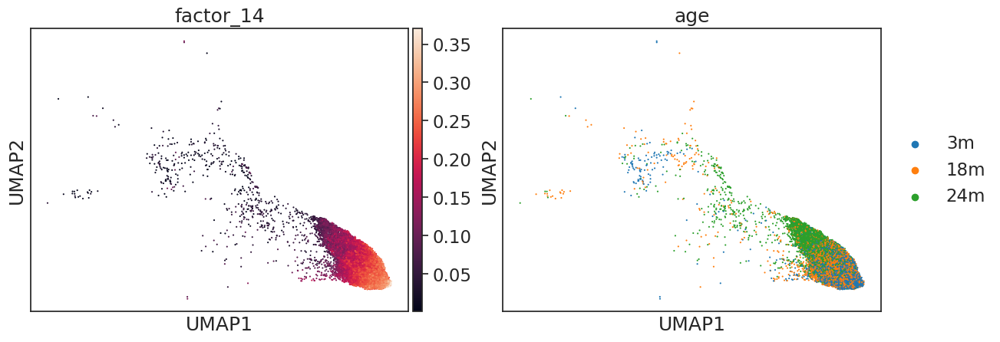

In [72]:
sc.pl.umap(shuffled_adata[shuffled_adata.obs["cell_type_grouped"] == "MICROGLIA"], color=["factor_14", "age"], ncols=2)

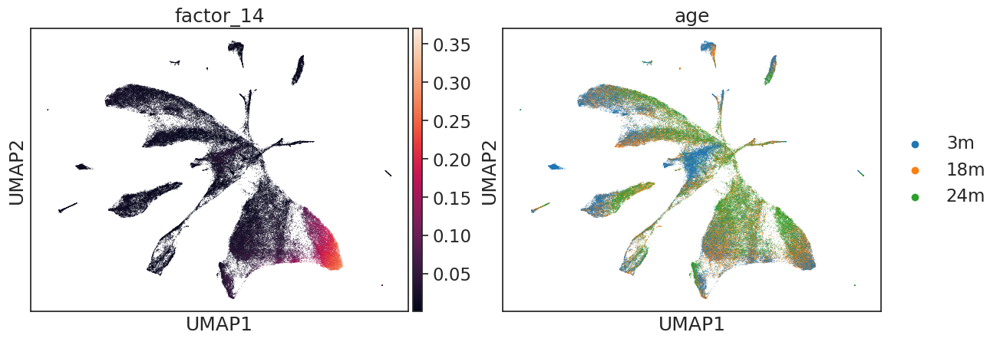

In [73]:
sc.pl.umap(shuffled_adata, color=["factor_14", "age"], ncols=2)

/gpfs/commons/home/kisaev/miniconda3/envs/LeafletSC/lib/python3.10/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


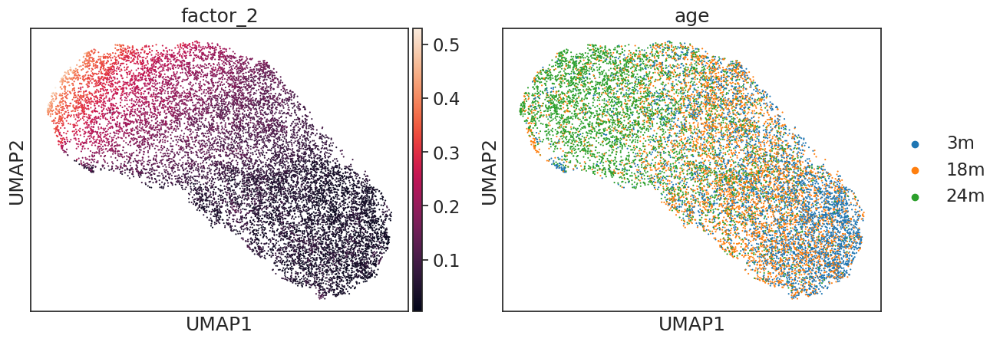

In [74]:
top_factors = top_factors_by_cell_type["MICROGLIA"]
shuffled_indices = np.random.permutation(splice_adata_microglia.obs.index)
shuffled_microglia_adata = splice_adata_microglia[shuffled_indices, :]
sc.pl.umap(shuffled_microglia_adata, color=["factor_2"] + ["age"], ncols=3)

In [75]:
# genes_ids = atses[["gene_id", "gene_name"]].drop_duplicates()
# aging_genes = global_aging_genes[global_aging_genes["global_aging_genes"].isin(splice_adata.var["gene_name"])].global_aging_genes.values
# genes_ids['aging_genes'] = genes_ids['gene_name'].isin(unique_aging_genes).map({True: 'yes', False: 'no'})
# genes_ids.aging_genes.value_counts()
# juncs_factors_albf = juncs_factors_albf.merge(genes_ids)

In [ ]:
# let's keep looking at just ["factor_5", "factor_36", "factor_9"] for now for example 
# can we get the splice junctions enriched in each factor?
subset_df = juncs_factors_albf[juncs_factors_albf["Factor"] == "Factor 19"]
# Step 2: Sort first by 'aging_genes' (placing 'yes' first) and then by 'ALBF' in descending order
sorted_df = subset_df.sort_values(by=["aging_genes", "ALBF"], ascending=[False, False])
sorted_df = subset_df.sort_values(by="ALBF", ascending=False)

# View the sorted DataFrame
print(sorted_df)

In [ ]:
# Step 2: Select the top 50 junctions
top_50_junctions = sorted_df.head(20)

# Step 3: Create a bar plot to show the top 50 junctions and their ALBF scores
plt.figure(figsize=(7, 9))

# Define colors based on the aging_genes column ('yes' for aging genes, 'no' for non-aging genes)
color_palette = {'yes': 'red', 'no': 'blue'}

# Plot the barplot with different colors based on the aging_genes column
sns.barplot(x="ALBF", y="junction_id", data=top_50_junctions, hue="aging_genes", dodge=False, palette=color_palette)

# Italicize gene names
italic_font = FontProperties(style='italic')

# Add the gene names as labels for each junction with italic font
for i in range(top_50_junctions.shape[0]):
    plt.text(top_50_junctions["ALBF"].values[i] + 1, i, 
             top_50_junctions["gene_name"].values[i], 
             fontproperties=italic_font, color='black', va="center", fontsize=12)

# Set labels and title
plt.xlabel("ALBF Score", fontsize=14)
plt.ylabel("Junction ID", fontsize=14)

plt.yticks(fontsize=14)

# Adjust layout to prevent legend or labels from being clipped
plt.tight_layout()
plt.savefig("factor19_top_junctions.pdf", format='pdf')

# Show the plot
plt.show()

In [ ]:
junction_id_index = 53200  # Replace with the actual index for the junction of interest
splice_adata_microglia.obs['junction_psi'] = splice_adata_microglia.layers['smooth_psi'][:, junction_id_index].flatten()

# Step 2: Plot UMAP with junction usage ratio
sc.pl.umap(splice_adata_microglia, color=['junction_psi'], color_map='coolwarm', size=15)

In [ ]:
junction_id_index = 53199  # Replace with the actual index for the junction of interest
splice_adata_microglia.obs['junction_psi'] = splice_adata_microglia.layers['smooth_psi'][:, junction_id_index].flatten()

# Step 2: Plot UMAP with junction usage ratio
sc.pl.umap(splice_adata_microglia, color=['junction_psi'], color_map='coolwarm', size=15)

In [76]:
def logistic_regression_feature_prediction(
    splice_adata,
    gene_expression_adata,
    feature: str,
    K: int = 50,
    n_pcs: int = 50,
    test_size: float = 0.2,
    random_state: int = 42
):
    """
    Train and evaluate multinomial logistic regression models using splicing factors,
    gene expression PCs, tissue covariate, and their combination to predict the feature of interest.
    
    Parameters:
    - splice_adata: AnnData object containing splicing data with latent factors in `obs`.
    - gene_expression_adata: AnnData object containing gene expression data.
    - feature: str, name of the feature to predict (e.g., 'age', 'cell_type_grouped').
    - K: int, number of splicing latent factors to use.
    - n_pcs: int, number of gene expression PCs to use.
    - test_size: float, proportion of the data to use for testing.
    - random_state: int, seed for reproducibility.
    
    Returns:
    - accuracies: dict, accuracy scores for each model.
    - models: dict, trained LogisticRegression models.
    - label_encoder: LabelEncoder instance used to encode the target variable.
    - coefficients_dfs: dict, DataFrames with logistic regression coefficients for each model.
    """
    
    # Step 1: Extract splicing latent factors
    latent_factors = [f'factor_{i}' for i in range(1, K + 1)]
    X_splicing = splice_adata.obs[latent_factors]
    
    # Step 2: Compute gene expression PCs
    pcs = gene_expression_adata.obsm['X_pca'][:, :n_pcs]
    pc_columns = [f'PC_{i+1}' for i in range(n_pcs)]
    X_gene_expression = pd.DataFrame(pcs, index=gene_expression_adata.obs_names, columns=pc_columns)
    
    # Step 3: One-hot encode the "tissue" covariate
    tissue_encoder = OneHotEncoder()
    tissue_covariate = tissue_encoder.fit_transform(splice_adata.obs[['tissue']])
    tissue_columns = [f'tissue_{cat}' for cat in tissue_encoder.categories_[0]]
    
    # Convert tissue covariate to DataFrame
    X_tissue = pd.DataFrame(tissue_covariate.toarray(), index=splice_adata.obs_names, columns=tissue_columns)

    # Add tissue covariate to splicing and gene expression datasets
    X_splicing = pd.concat([X_splicing, X_tissue], axis=1)
    X_gene_expression = pd.concat([X_gene_expression, X_tissue], axis=1)
    
    # Step 4: Prepare combined dataset and scale it
    X_combined = pd.concat([X_splicing, X_gene_expression], axis=1)
    scaler = StandardScaler()
    X_combined_scaled = pd.DataFrame(scaler.fit_transform(X_combined), index=X_combined.index, columns=X_combined.columns)

    # Step 5: Encode the target variable
    label_encoder = LabelEncoder()
    y = splice_adata.obs[feature].astype(str)  # Ensure the feature is a string type
    y_encoded = label_encoder.fit_transform(y)
    
    # Step 6: Split the data
    X_train_s, X_test_s, y_train, y_test = train_test_split(
        X_splicing, y_encoded, test_size=test_size, random_state=random_state
    )
    X_train_g, X_test_g, _, _ = train_test_split(
        X_gene_expression, y_encoded, test_size=test_size, random_state=random_state
    )
    X_train_c, X_test_c, _, _ = train_test_split(
        X_combined_scaled, y_encoded, test_size=test_size, random_state=random_state
    )
    X_train_t, X_test_t, _, _ = train_test_split(
        X_tissue, y_encoded, test_size=test_size, random_state=random_state
    )
    
    # Step 7: Train logistic regression models
    logreg_params = {
        'multi_class': 'multinomial',
        'solver': 'lbfgs',
        'max_iter': 1000,
        'random_state': random_state
    }
    model_splicing = LogisticRegression(**logreg_params)
    model_gene_expression = LogisticRegression(**logreg_params)
    model_combined = LogisticRegression(**logreg_params)
    model_tissue = LogisticRegression(**logreg_params)  # New model for tissue
    
    model_splicing.fit(X_train_s, y_train)
    model_gene_expression.fit(X_train_g, y_train)
    model_combined.fit(X_train_c, y_train)
    model_tissue.fit(X_train_t, y_train)  # Train tissue-only model
    
    # Step 8: Evaluate the models
    y_pred_s = model_splicing.predict(X_test_s)
    y_pred_g = model_gene_expression.predict(X_test_g)
    y_pred_c = model_combined.predict(X_test_c)
    y_pred_t = model_tissue.predict(X_test_t)  # Predictions for tissue-only model

    # Predict probabilities for AUROC and AUPR
    y_prob_s = model_splicing.predict_proba(X_test_s)
    y_prob_g = model_gene_expression.predict_proba(X_test_g)
    y_prob_c = model_combined.predict_proba(X_test_c)
    y_prob_t = model_tissue.predict_proba(X_test_t)

    accuracy_s = accuracy_score(y_test, y_pred_s)
    accuracy_g = accuracy_score(y_test, y_pred_g)
    accuracy_c = accuracy_score(y_test, y_pred_c)
    accuracy_t = accuracy_score(y_test, y_pred_t)  # Accuracy for tissue-only model
    
    # AUROC and AUPR scores
    try:
        auroc_s = roc_auc_score(y_test, y_prob_s, multi_class='ovr')
        auroc_g = roc_auc_score(y_test, y_prob_g, multi_class='ovr')
        auroc_c = roc_auc_score(y_test, y_prob_c, multi_class='ovr')
        auroc_t = roc_auc_score(y_test, y_prob_t, multi_class='ovr')

        aupr_s = average_precision_score(y_test, y_prob_s, average='macro')
        aupr_g = average_precision_score(y_test, y_prob_g, average='macro')
        aupr_c = average_precision_score(y_test, y_prob_c, average='macro')
        aupr_t = average_precision_score(y_test, y_prob_t, average='macro')

    except ValueError as e:
        # Handle any exception that might occur due to the number of classes
        print(f"Error calculating AUROC/AUPR: {e}")
        auroc_s = auroc_g = auroc_c = auroc_t = None
        aupr_s = aupr_g = aupr_c = aupr_t = None

    print(f"{feature.capitalize()} Prediction Accuracy using Splicing Factors: {accuracy_s:.4f}")
    print(f"{feature.capitalize()} Prediction AUROC using Splicing Factors: {auroc_s:.4f}")
    print(f"{feature.capitalize()} Prediction AUPR using Splicing Factors: {aupr_s:.4f}")
    
    print(f"{feature.capitalize()} Prediction Accuracy using Gene Expression PCs: {accuracy_g:.4f}")
    print(f"{feature.capitalize()} Prediction AUROC using Gene Expression PCs: {auroc_g:.4f}")
    print(f"{feature.capitalize()} Prediction AUPR using Gene Expression PCs: {aupr_g:.4f}")
    
    print(f"{feature.capitalize()} Prediction Accuracy using Combined Features: {accuracy_c:.4f}")
    print(f"{feature.capitalize()} Prediction AUROC using Combined Features: {auroc_c:.4f}")
    print(f"{feature.capitalize()} Prediction AUPR using Combined Features: {aupr_c:.4f}")
    
    print(f"{feature.capitalize()} Prediction Accuracy using Tissue Only: {accuracy_t:.4f}")
    print(f"{feature.capitalize()} Prediction AUROC using Tissue Only: {auroc_t:.4f}")
    print(f"{feature.capitalize()} Prediction AUPR using Tissue Only: {aupr_t:.4f}")
        
    # Step 9: Retrain models on full dataset for coefficient analysis
    model_splicing.fit(X_splicing, y_encoded)
    model_gene_expression.fit(X_gene_expression, y_encoded)
    model_combined.fit(X_combined_scaled, y_encoded)
    model_tissue.fit(X_tissue, y_encoded)  # Retrain tissue-only model
    
    # Step 10: Prepare coefficients DataFrames
    coef_splicing = pd.DataFrame(
        model_splicing.coef_, columns=latent_factors + tissue_columns, index=label_encoder.classes_
    )
    coef_gene_expression = pd.DataFrame(
        model_gene_expression.coef_, columns=pc_columns + tissue_columns, index=label_encoder.classes_
    )
    coef_combined = pd.DataFrame(
        model_combined.coef_, columns=X_combined.columns, index=label_encoder.classes_
    )
    coef_tissue = pd.DataFrame(
        model_tissue.coef_, columns=tissue_columns, index=label_encoder.classes_  # Coefficients for tissue-only model
    )
    
    # Collect results
    accuracies = {
        'splicing': accuracy_s,
        'gene_expression': accuracy_g,
        'combined': accuracy_c,
        'tissue_only': accuracy_t  # Include tissue-only accuracy
    }

    aurocs = {
        'splicing': auroc_s,
        'gene_expression': auroc_g,
        'combined': auroc_c,
        'tissue_only': auroc_t
    }
    
    auprs = {
        'splicing': aupr_s,
        'gene_expression': aupr_g,
        'combined': aupr_c,
        'tissue_only': aupr_t
    }
    
    models = {
        'splicing': model_splicing,
        'gene_expression': model_gene_expression,
        'combined': model_combined,
        'tissue_only': model_tissue  # Include tissue-only model
    }
    
    coefficients_dfs = {
        'splicing': coef_splicing,
        'gene_expression': coef_gene_expression,
        'combined': coef_combined,
        'tissue_only': coef_tissue  # Include tissue-only coefficients
    }
    
    return accuracies, aurocs, auprs, models, label_encoder, coefficients_dfs

In [77]:
# Assume splice_adata and gene_expression_adata are already loaded and preprocessed

feature_to_predict = 'age'  # Replace with your target feature
accuracies, aurocs, auprs, models, label_encoder, coefficients_dfs = logistic_regression_feature_prediction(
    splice_adata,
    adata,
    feature=feature_to_predict,
    K=30,
    n_pcs=50,
    test_size=0.2,
    random_state=42
)

Age Prediction Accuracy using Splicing Factors: 0.6011
Age Prediction AUROC using Splicing Factors: 0.7796
Age Prediction AUPR using Splicing Factors: 0.6291
Age Prediction Accuracy using Gene Expression PCs: 0.6171
Age Prediction AUROC using Gene Expression PCs: 0.7969
Age Prediction AUPR using Gene Expression PCs: 0.6524
Age Prediction Accuracy using Combined Features: 0.6833
Age Prediction AUROC using Combined Features: 0.8512
Age Prediction AUPR using Combined Features: 0.7352
Age Prediction Accuracy using Tissue Only: 0.4220
Age Prediction AUROC using Tissue Only: 0.5985
Age Prediction AUPR using Tissue Only: 0.4084


In [78]:
print(accuracies)

{'splicing': 0.6011299435028249, 'gene_expression': 0.617090395480226, 'combined': 0.6833333333333333, 'tissue_only': 0.4219868173258004}


In [79]:
coef_splicing = coefficients_dfs['splicing']
coef_gene_expression = coefficients_dfs['gene_expression']
coef_combined = coefficients_dfs['combined']
coef_tissue_only = coefficients_dfs['tissue_only']

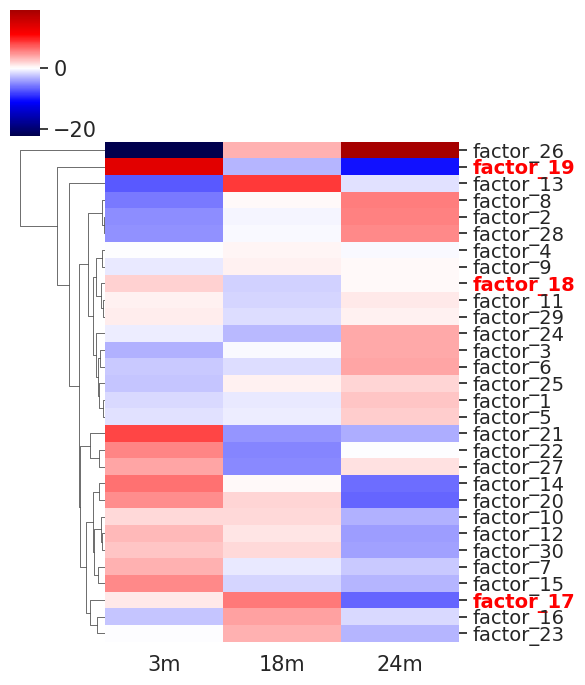

In [80]:
# Define the desired order for the columns (age categories)
age_order = ['3m', '18m', '24m']

# Ensure the index or columns are sorted by the desired order (if they are in columns, use .loc[:, age_order])
# Assuming age_order is the index, not columns:
coef_splicing_sorted = coef_splicing.loc[age_order]

# Keep just the columns with "factor_" in them
coef_splicing_sorted = coef_splicing_sorted.filter(like='factor_')

# Create the clustermap
g = sns.clustermap(coef_splicing_sorted.T, cmap="seismic", annot=False, figsize=(6, 7), row_cluster=True, col_cluster=False, xticklabels=1, yticklabels=1, center=0)

# Set y-axis tick labels (rows) font size and rotation
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=14)

# Set x-axis tick labels (columns) font size
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), fontsize=15)

# Disable color bar visibility
g.cax.set_visible(True)

# Highlight specific factors (rows)
highlighted_factors = ['factor_17', 'factor_18', 'factor_19']
for label in g.ax_heatmap.yaxis.get_majorticklabels():
    if label.get_text() in highlighted_factors:
        label.set_weight('bold')   # Make it bold
        label.set_color('red')     # Change color to red (you can choose any color)

# Set colorbar font size
g.cax.tick_params(labelsize=15)

date_str = datetime.now().strftime("%Y-%m-%d")
filename = f"factor_age_coefficients_{date_str}.pdf"
    
# Save the figure to a PDF
plt.savefig(filename, format='pdf')

# Show the plot
plt.show()

In [81]:
# Calculate entropy for each cell (each row sums to 1)
entropy = -np.sum(assign_post * np.log(assign_post + 1e-12), axis=1)  # Small epsilon added for numerical stability
entropy

array([2.804667  , 2.03158034, 2.579343  , ..., 2.61338525, 2.5867794 ,
       2.76390972])

In [82]:
# Calculate perplexity for each cell
perplexity = np.exp(entropy)

# Combine results for better readability
results = np.column_stack((entropy, perplexity))

# Display the first few results
print("Entropy and Perplexity for each cell (first 10 cells):")
print(results[:10])

Entropy and Perplexity for each cell (first 10 cells):
[[ 2.804667   16.52157325]
 [ 2.03158034  7.62612871]
 [ 2.579343   13.18847044]
 [ 2.29862422  9.96046961]
 [ 2.57370892 13.11437448]
 [ 2.46867454 11.80678707]
 [ 2.72339122 15.2318895 ]
 [ 3.07304501 21.60759793]
 [ 2.81048881 16.61803927]
 [ 2.41308884 11.1684053 ]]


In [83]:
splice_adata.obs["perplexity"] = perplexity
splice_adata.obs["entropy"] = entropy

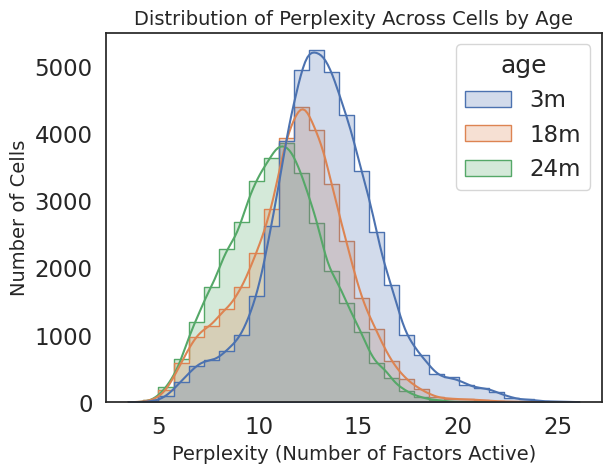

In [84]:
# Assuming `perplexity` is already added to `splice_adata.obs` as a column
sns.histplot(data=splice_adata.obs, x="perplexity", hue="age", bins=30, kde=True, element="step")
plt.xlabel("Perplexity (Number of Factors Active)", fontsize=14)
plt.ylabel("Number of Cells", fontsize=14)
plt.title("Distribution of Perplexity Across Cells by Age", fontsize=14)
plt.show()

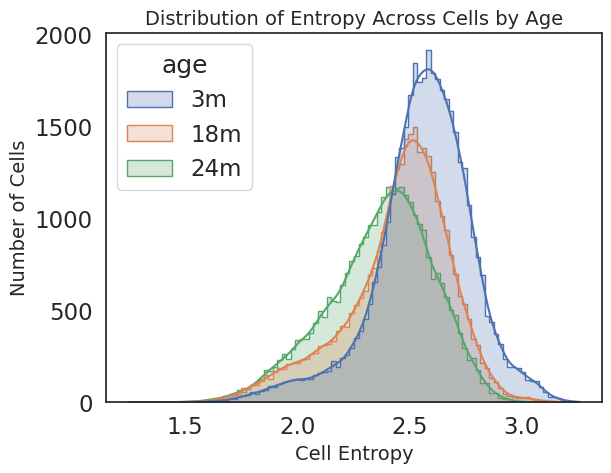

In [85]:
# Assuming `perplexity` is already added to `splice_adata.obs` as a column
sns.histplot(data=splice_adata.obs, x="entropy", hue="age", bins=100, kde=True, element="step")
plt.xlabel("Cell Entropy", fontsize=14)
plt.ylabel("Number of Cells", fontsize=14)
plt.title("Distribution of Entropy Across Cells by Age", fontsize=14)
plt.show()

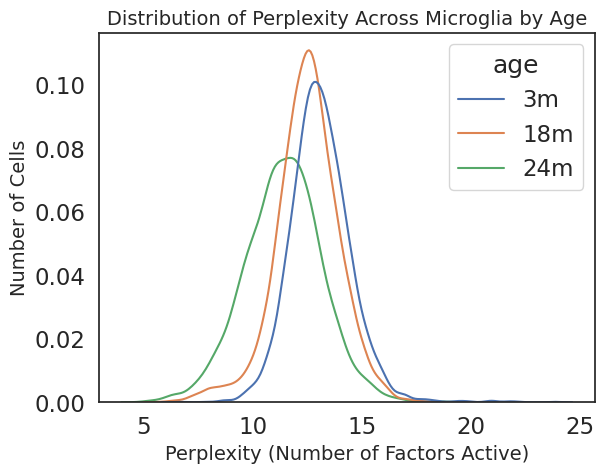

In [86]:
microglia_only = splice_adata.obs[splice_adata.obs["cell_type_grouped"] == "MICROGLIA"]
sns.kdeplot(data=microglia_only, x="perplexity", hue="age")
plt.xlabel("Perplexity (Number of Factors Active)", fontsize=14)
plt.ylabel("Number of Cells", fontsize=14)
plt.title("Distribution of Perplexity Across Microglia by Age", fontsize=14)
plt.show()

In [87]:
microglia_only.sex.value_counts()

sex
male      8110
female    4686
Name: count, dtype: int64

In [88]:
splice_adata.obs[splice_adata.obs["perplexity"]<3].sort_values(by="perplexity", ascending=False).tissue.value_counts()

tissue
Aorta                0
BAT                  0
Bladder              0
Brain_Myeloid        0
Brain_Non-Myeloid    0
Diaphragm            0
GAT                  0
Heart                0
Kidney               0
Large_Intestine      0
Limb_Muscle          0
Liver                0
Lung                 0
MAT                  0
Mammary_Gland        0
Marrow               0
Pancreas             0
SCAT                 0
Skin                 0
Spleen               0
Thymus               0
Tongue               0
Trachea              0
Name: count, dtype: int64

In [89]:
factor_columns = [f'factor_{i}' for i in range(1, 31)]

In [90]:
factor_corr_spearman_all = splice_adata.obs[factor_columns].corr(method='spearman')

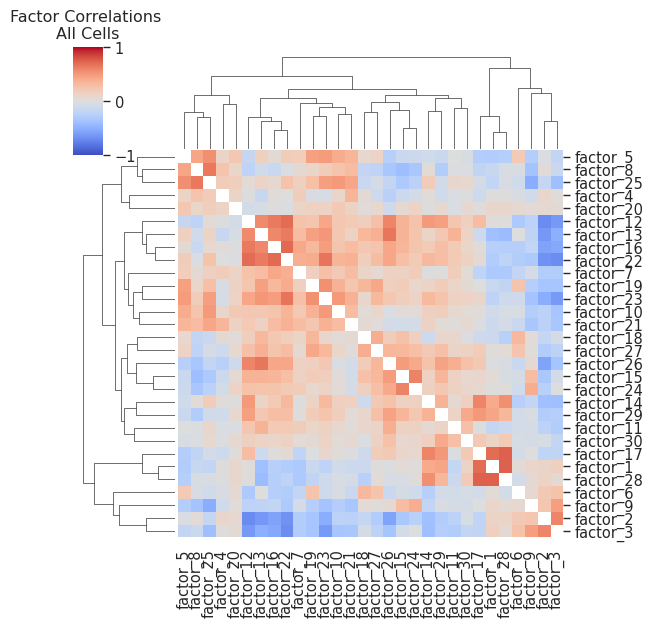

In [91]:
# Create a mask to hide the diagonal
mask = np.eye(len(factor_corr_spearman_all), dtype=bool)

# Set overall font size smaller using Seaborn context
sns.set_context("paper", font_scale=1.2)  # Adjust `font_scale` for smaller/larger font

# Create a clustermap with masked diagonal
g = sns.clustermap(
    factor_corr_spearman_all, annot=False, cmap='coolwarm', center=0, mask=mask,
    yticklabels=1, xticklabels=1, figsize=(6, 6), vmin=-1, vmax=1)

plt.title("Factor Correlations \nAll Cells")
plt.show()

In [ ]:
splice_adata.var[splice_adata.var["gene_name"] == "Fgfr2"]

/scratch/ipykernel_3048798/2709389559.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_perplexity = splice_adata.obs.groupby(['cell_type_grouped', 'age'])['perplexity'].median().unstack()


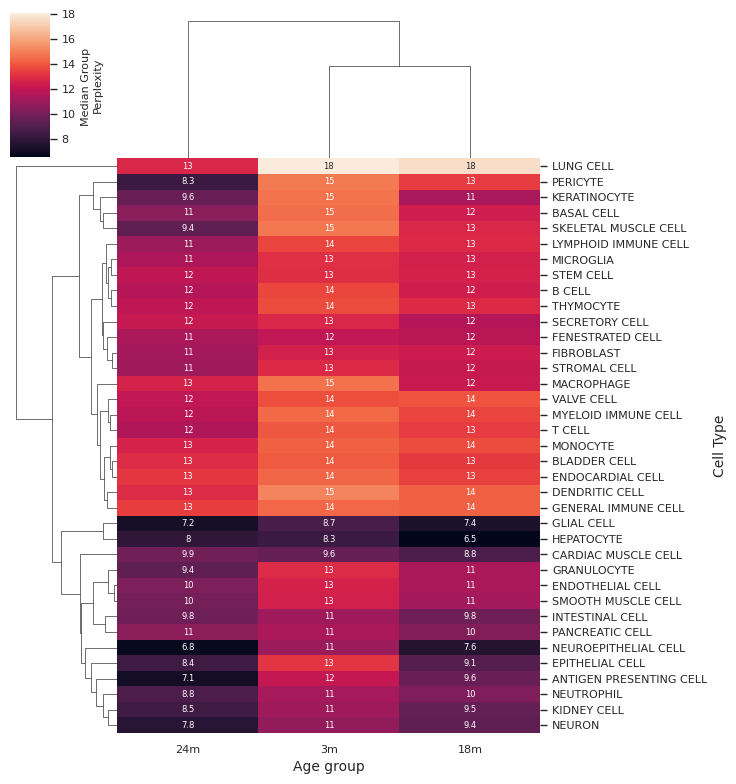

In [92]:
# Calculate median perplexity for each cell type and age category
median_perplexity = splice_adata.obs.groupby(['cell_type_grouped', 'age'])['perplexity'].median().unstack()

# Make font size for ERVERYTHING smaller!
g = sns.clustermap(median_perplexity, xticklabels=1, yticklabels=1, 
               annot_kws={"size": 6},  # Smaller font size for annotations
               annot=True, figsize=(8, 8), 
               cbar_kws={'label': 'Median Group \nPerplexity'})

# Set font size for row and column tick labels
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, fontsize=8)
plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), fontsize=8)

# Customize the color legend font size
g.cax.yaxis.label.set_size(8)
g.cax.tick_params(labelsize=8)

# Set axis labels with smaller font size
g.ax_heatmap.set_xlabel("Age group", fontsize=10)
g.ax_heatmap.set_ylabel("Cell Type", fontsize=10)

plt.show()

In [93]:
# Load data and create the database (note this may take 1-2 minutes)
gtf_file = "/gpfs/commons/groups/knowles_lab/Karin/Leaflet-analysis-WD/TabulaSenis/genome_files/gencode.vM19/genes/genes.gtf"
db = ja.create_db(gtf_file)

In [94]:
# junction_id  Cluster  usage_ratio
splice_adata_var = juncs_factors_albf[["junction_id", "Cluster"]].drop_duplicates()
splice_adata_var["usage_ratio"] = 0

In [95]:
# Convert junction_ids
splice_junctions = ja.convert_junction_ids(splice_adata_var)
print(splice_junctions)

[{'chrom': 'chr10', 'start': 100080130, 'end': 100080856, 'name': 'junction_1', 'strand': '+', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100080130, 'end': 100087346, 'name': 'junction_31', 'strand': '+', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100080940, 'end': 100087346, 'name': 'junction_61', 'strand': '+', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100478022, 'end': 100485050, 'name': 'junction_91', 'strand': '-', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100478022, 'end': 100487161, 'name': 'junction_121', 'strand': '-', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100485125, 'end': 100487161, 'name': 'junction_151', 'strand': '-', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100578431, 'end': 100582262, 'name': 'junction_181', 'strand': '-', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100578431, 'end': 100583913, 'name': 'junction_211', 'strand': '-', 'usage_ratio': 0}, {'chrom': 'chr10', 'start': 100582322, 'end': 100583913, 'name': 'junction_241', 'st

In [97]:
# Check junction annotations
junction_annotation_results = ja.check_junction_annotation(splice_junctions, db)

# Extract unique transcript IDs from junction_labels
unique_transcripts = list({transcript for label in junction_annotation_results for transcript in label['transcripts']})

100%|██████████| 64882/64882 [08:07<00:00, 133.02it/s]


In [103]:
print(junction_annotation_results[1])

{'junction': 'chr10:100080130-100087346', 'strand': '+', 'label_5_prime': "annotated on 5'", 'label_3_prime': "annotated on 3'", 'position_off_5_prime': 0, 'position_off_3_prime': 1, 'transcripts': ['ENSMUST00000105283.8', 'ENSMUST00000020129.7']}


In [ ]:
splice_junctions

In [102]:
pd.DataFrame(junction_annotation_results)

,junction,strand,label_5_prime,label_3_prime,position_off_5_prime,position_off_3_prime,transcripts
0,chr10:100080130-100080856,+,annotated on 5',annotated on 3',0.0,1.0,"[ENSMUST00000105283.8, ENSMUST00000020129.7]"
1,chr10:100080130-100087346,+,annotated on 5',annotated on 3',0.0,1.0,"[ENSMUST00000105283.8, ENSMUST00000020129.7]"
2,chr10:100080940-100087346,+,annotated on 5',annotated on 3',0.0,1.0,[ENSMUST00000105283.8]
3,chr10:100478022-100485050,-,annotated on 5',annotated on 3',1.0,0.0,"[ENSMUST00000128009.1, ENSMUST00000134477.1, E..."
4,chr10:100478022-100487161,-,annotated on 5',annotated on 3',1.0,0.0,"[ENSMUST00000128009.1, ENSMUST00000134477.1, E..."
...,...,...,...,...,...,...,...
64877,chrY:90819840-90820595,+,unannotated on 5',unannotated on 3',NaN,NaN,[]
64878,chrY:90820214-90820448,-,unannotated on 5',unannotated on 3',NaN,NaN,[]
64879,chrY:90837279-90838776,-,unannotated on 5',unannotated on 3',NaN,NaN,[]
64880,chrY:90837520-90841656,+,annotated on 5',annotated on 3',0.0,1.0,[ENSMUST00000189352.1]


In [ ]:
splice_adata_var = splice_adata_var[splice_adata_var["Cluster"] == 26488] # Fgfr2 related cluster

In [ ]:
# Let's limit to just Fgfr2 mutually exclusive exons isoforms 120187 and 122054
# unique_transcripts = ["ENSMUST00000120187.8", "ENSMUST00000122054.7"]

In [ ]:
# Fetch transcript exon coordinates and determine plot boundaries
transcript_data = ja.fetch_transcripts_and_annotations(unique_transcripts, db)
region_start, region_end = ja.determine_region_boundaries(splice_junctions)

In [ ]:
junc_annots = ja.check_junction_annotation(splice_junctions, db)

In [ ]:
import importlib
importlib.reload(ja)

In [ ]:
splice_junctions

In [ ]:
juncs_factors_albf.sort_values(by="ALBF", ascending=False)

In [ ]:
region_start, region_end

In [ ]:
ja.plot_exons_and_junctions(db, transcript_data, splice_junctions, region_start, region_end, base_width=10, trans_height=0.3, show_usage=False, show_junc_lines=True)

In [ ]:
-1000 +1.302e8

In [ ]:
splice_adata.var[splice_adata.var["junction_id"] == "chr7_130198563_130200982_-"]["junction_id_index"]

In [ ]:
splice_adata_var

In [ ]:
splice_adata

In [ ]:
sc.pl.umap(splice_adata, color=['cell_type_grouped'], size=10)

In [ ]:
splice_adata.var[splice_adata.var.Cluster == 26488]

In [ ]:
junction_id_index = 42968  #chr7_130196374_130198418_- --> 	 
splice_adata.obs['junction_psi'] = splice_adata.layers['smooth_psi'][:, junction_id_index].flatten()

# Step 2: Plot UMAP with junction usage ratio
sc.pl.umap(splice_adata, color=['junction_psi'], color_map='coolwarm', size=15)

In [ ]:
junction_id_index = 42969 # chr7_130196374_130199757_- # Replace with the actual index for the junction of interest
splice_adata.obs['junction_psi'] = splice_adata.layers['smooth_psi'][:, junction_id_index].flatten()

# Step 2: Plot UMAP with junction usage ratio
sc.pl.umap(splice_adata, color=['junction_psi'], color_map='coolwarm', size=15)